<h1>Дипломный проект</h1>
<h2>Определение уязвимых групп населения</h2>
<ul>Задача:
    <li>кластеризовать регионы России и определить, какие из них наиболее остро нуждаются в помощи малообеспеченным/неблагополучным слоям населения;</li>
    <li>описать группы населения, сталкивающиеся с бедностью;</li>
    <li>определить:
        <ul>
            <li>влияет ли число детей, пенсионеров и других социально уязвимых групп на уровень бедности в регионе;</li>
            <li>связаны ли уровень бедности/социального неблагополучия с производством и потреблением в регионе;</li>
            <li>какие ещё зависимости можно наблюдать относительно социально незащищённых слоёв населения.</li>
        </ul>
    </li>
</ul>



In [88]:
import pandas as pd
import numpy as np
from sklearn import linear_model
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn import preprocessing
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans


<h3>Знакомство с данными</h3>
Загрузка всех необходимых таблиц, разведывательный анализ данных.

Объявим функцию, которая обеспечит нам опеределение уровня региона: вся Федерация, Федеральный округ и т.д.<br />
<ul>
<li>Уровень 0 - Российская Федерация;</li>
<li>уровень 1 - федеральный округ;</li>
<li>уровень 2 - интересующие нас регионы;</li>
<li>уровень 3 - автономии в составе области.</li>


In [89]:
def region_level(x):
    if x.find('Федерация') > -1:
        return 0
    elif x.find('федеральный округ') > -1:
        return 1
    elif x.find('область)') > -1:
        return 3
    elif x.find('область (') > -1:
        return 3
    elif x.find('область без') > -1:
        return 3
    elif x.find('в том числе') > -1:
        return 1
    else:
        return 2

Не во всех таблицах регионы имеют одинаковые названия. Для решения данной проблемы напишем небольшую функцию. "Правильным" будем считать наименование из таблицы population.xlsx

In [90]:
#Написание регионов в данных сильно разнятся от датасета к датасету, иногда наименование выглядит идентично, но идет замещение русских букв латинскими такого же вида.
def region_rename(x):
    if x.find('Москва') > - 1 and x.find('старых') == -1:
        return 'Город Москва столица Российской Федерации город федерального значения'
    elif x.find('Санкт-Петербург') > - 1 or x.find('Санкт - Петербург') > - 1:
        return 'Город Санкт-Петербург город федерального значения'
    elif x.find('Севастополь') > - 1:
        return 'Город федерального значения Севастополь'
    elif x.find('Ямало-Ненецкий') > -1 or x.find('Ямало-Ненецкий') > -1 or x.find('Ямало-Hенецкий') > -1:
        return 'Ямало-Ненецкий автономный округ (Тюменская область)'
    elif x.find('Архангельская') > - 1 and (x.find('(') == -1 or x.find('(без АО)') > -1):
        return 'Архангельская область (кроме Ненецкого автономного округа)'
    elif (x.find('Ненецкий автономный округ') > -1) or (x.find('Ненецкий авт. округ') > -1):
        return 'Ненецкий автономный округ (Архангельская область)'
    elif x.find('Республика Адыгея') > -1:
        return 'Республика Адыгея (Адыгея)'
    elif x.find('Республика Татарстан') > -1:
        return 'Республика Татарстан (Татарстан)'
    elif x.find('Чувашская Республика') > -1:
        return 'Чувашская Республика - Чувашия'
    elif (x.find('Тюменская область') > -1 and (x.find('(') == -1 or x.find('(без АО)') > -1)) or x.find('Тюменская обл.без') > -1:
        return 'Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)'
    elif x.find('Ханты-Мансийский') > -1:
        return 'Ханты-Мансийский автономный округ - Югра (Тюменская область)'
    elif x.find('Кемеровская область') > -1:
        return 'Кемеровская область - Кузбасс'
    elif x.find('Bладимирская область') > -1:
        return 'Владимирская область'
    elif x.find('Bоронежская область') > -1:
        return 'Воронежская область'
    elif x.find('Bологодская область') > -1:
        return 'Вологодская область'
    elif x.find('Bолгоградская область') > -1:
        return 'Волгоградская область'
    elif x.find('Республика Северная Осетия - Алания') > -1:
        return 'Республика Северная Осетия-Алания'
    elif x.find('Республика Саха(Якутия)') > -1:
        return 'Республика Саха (Якутия)'
    elif x.find('Еврейская авт. область') > -1:
        return 'Еврейская автономная область'
    elif x.find('Чукотский авт. округ') > -1:
        return 'Чукотский автономный округ'
    else:
        return x

Рассмотрим таблицу population.xlsx, которая содержит данные о численности постоянного населения на 1 января.<br/>
В данной таблице данные начинаются со второй строки, третья строка не содержит ничего интересного. Учтём это при чтении. Кроме того, первые два поля не имеют заголовков &mdash; - переименуем столбцы. И последнее действие, которое нам предстоит выполнить при чтении &mdash; явно укажем тип поля для ОКАТО (второй столбец).

In [91]:
population_df = pd.read_excel("data/population.xlsx", skiprows=[0, 2], dtype = {'Unnamed: 1': str})
population_df.rename(columns = {'Unnamed: 0':'region', 'Unnamed: 1':'okato'}, inplace=True)
display(population_df.head())

,region,okato,январь 1999 г.,январь 2000 г.,январь 2001 г.,январь 2002 г.,январь 2003 г.,январь 2004 г.,январь 2005 г.,январь 2006 г.,...,январь 2013 г.,январь 2014 г.,январь 2015 г.,январь 2016 г.,январь 2017 г.,январь 2018 г.,январь 2019 г.,январь 2020 г.,январь 2021 г.,январь 2022 г.
0,Российская Федерация,643,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Раздел 1. Муниципальные образования субъектов ...,00000000000,147539426.0,146890128.0,146303611.0,145649334.0,144963650.0,144333586.0,143801046.0,143236582.0,...,143347059.0,143666931.0,146267288.0,146544710.0,146804372.0,146880432.0,146780720.0,146748590.0,146171015.0,145557576.0
2,Центральный федеральный округ,030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Раздел 1. Муниципальные образования субъектов ...,00000000000,38311159.0,38227656.0,38175094.0,38068452.0,37946810.0,37965073.0,38044068.0,38109006.0,...,38678913.0,38819874.0,38951479.0,39104319.0,39209582.0,39311413.0,39378059.0,39433556.0,39250960.0,39104400.0
4,Белгородская область,14000000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


В данной таблице одна строка содержит наименование региона, а следующая за ней &mdash; необходимые данные. Создадим таблицу, в которой данные будут располагаться в одной строке с наименованием региона. Одновременно с этим переименуем стобцы, оставив в заголовке только год на единицу меньше, чем в текущем заголовке, т.е. вместо "январь 1999 г." установим заголовок "1998". Ещё одно преобразование будет заключать в себя внесение в новую таблицу только регионы без РФ и федеральных округов. Учтём при этом особенности Архангельской и Тюменской областей &mdash; оставим в новой таблице данные только по областям без входящих в них автономий и данные по самим автономиям.

In [92]:
population_clear_df = pd.DataFrame(columns=['region', 'okato'])

for index, row in population_df.iterrows():
    if len(row['okato']) == 11 and row['okato'] not in (['00000000000', '11000000000', '71000000000']):
        dict ={'region':row['region'],'okato':row['okato']}
        current_okato = row['okato']
    elif row['region'].find('Раздел 1') > -1 and not (current_okato is None):
        for i in range(1999, 2023):
            dict[str(i-1)] = row['январь {} г.'.format(i)]
        population_clear_df = pd.concat([population_clear_df, pd.DataFrame([dict])], ignore_index=True)
    else:
        current_okato = None
        dict = {}
#выведем данные по пропущенным значениям
#для того, чтобы убедиться в отсутствии пропущенных данных заменим все нули на пустые значения, т.к. не может регион полностью обезлюдеть
population_clear_df = population_clear_df.replace({'0': np.nan, 0: np.nan})
display(population_clear_df.isnull().sum())

#выясним, для каких регионов отсутствую данные на 1 января 2021 г.
display(population_clear_df[population_clear_df['2020'].isnull()][['region', 'okato']])

#эти шесть округов на сегодня не существуют, можно данные по ним удалить; до 2014 г. нет данных по Республике Крым и Севастополю - их оставим.
population_clear_df.dropna(subset='2020', inplace=True)

display(population_clear_df.isnull().sum())


region     0
okato      0
1998       4
1999       4
2000       4
2001       4
2002      10
2003       8
2004       8
2005       8
2006       8
2007       8
2008       8
2009       8
2010       8
2011       8
2012       8
2013       8
2014       6
2015       6
2016       6
2017       6
2018       6
2019       6
2020       6
2021       6
dtype: int64

,region,okato
51,"Коми-Пермяцкий округ, входящий в состав Пермск...",57100000000
69,Агинский Бурятский округ (Забайкальский край),76100000000
71,Таймырский (Долгано-Ненецкий) автономный округ...,04100000000
72,Эвенкийский автономный округ (Красноярский край),04130000000
75,Усть-Ордынский Бурятский округ,25100000000
83,"Корякский округ, входящий в состав Камчатского...",30100000000


region    0
okato     0
1998      4
1999      4
2000      4
2001      4
2002      4
2003      2
2004      2
2005      2
2006      2
2007      2
2008      2
2009      2
2010      2
2011      2
2012      2
2013      2
2014      0
2015      0
2016      0
2017      0
2018      0
2019      0
2020      0
2021      0
dtype: int64

После проведенных преобразований в таблице остались пустыми только данные до 2014 года. Большого смысла пытаться как-то сгенерировать эти данные нет, т.к. у нас во всех таблицах не будет данных по Крыму до 2014 года. Моделировать ситуацию, не беря этот регион в расчет было бы ошибкой, кроме того, появление его в составе России должно было оказать некоторое влияние на ситуацию по всей стране. Поэтому примем за основу тезис о том, что данные до 2014 года мы не рассматриваем.
После разбора таблицы population.xlsx можно сделать несколько выводов:<ul>
<li>у нас нет данных о численности населения по признаку "город/сельская местность"</li>
<li>у нас нет данных о численности населения по возрастным группам.</li>
</ul>
Следовательно, наличие в некоторых таблицах разбивки по данным признакам можно игнорировать, объединяя данные в одну строку.

Каждая таблица потребует определенного набора действий для приведения ее к необходимому виду.<br />
Чтобы не повторять блоки кода с одними и те же действиями, создадим функцию, включающую в себя весь набор стандартных преобразований.

In [93]:
def processing_data(current_df, population_df): # current_df - обраьатываемая таблица, population_df - подготовленная на предыдущем шаге population_clear_df
    processing_df = current_df.copy()
    #присвоим каждому региону свой уровень. 0 и 1 - это Российская Федерация и округ, 3 - автономные образование, входящее в регион, 2 - республика, край, область
    processing_df['level'] = processing_df['region'].apply(region_level)
    processing_df = processing_df[processing_df['level'] > 1].copy() #нас не интересуют сводные данные, поэтому оставим только уровни 2 и 3
    processing_df['region'] = processing_df['region'].apply(lambda x: x.lstrip())
    #Архангельскую и Тюменскую области придется рассматривать отдельно, т.к. в их составе есть АО, уровень жизни в которых может существенно отличаться от базового региона
    mask_region = (processing_df['region'] == 'Архангельская область') | (processing_df['region'] == 'Тюменская область')
    mask_dop_region = (processing_df['region'] == 'Архангельская область (без АО)') | (processing_df['region'] == 'Тюменская область (без АО)')


    processing_df = processing_df.drop(processing_df[mask_region | mask_dop_region].index)
    processing_df['region'] = processing_df['region'].apply(region_rename) #переименуем регионы, приведя их к общему виду

    #для контроля будем делать внешнее левое соединение двух датасетов, чтобы при необходимости дополнить обработку наименований, если при обработке очередного датасета поле 'okato' окажется пустым.
    processing_df = processing_df.merge(population_df[['region', 'okato']], on='region', how='left').drop(columns='level')
        
    return processing_df

Так как на ситуацию в регионе может оказать соотношение людей трудоспособного и нетрудоспособного возрастов, но таких данных предоставлено не было, загрузим интересующую нас информацию по мужчинам (https://www.fedstat.ru/indicator/31548) и женщинам (https://www.fedstat.ru/indicator/33459) по следующим группам:<ul>
<li>регионы - все;</li>
<li>численность постоянного населения всего;</li>
<li>численность постоянного населения в трудоспособном возрасте;</li>
<li>численность постоянного населения старше трудоспособного возраста;</li>
<li>отдельно мужчины, отдельно женщины;</li>
<li>период с 2012 года по 2021 год.</li>
</ul>
Численность населения, моложе трудоспособного возраста придется вычислять, т.к. не удалось получить данные по этой категории населения.

In [94]:

population_age_man_df = pd.read_excel("data/population_age_man.xlsx", skiprows=[0,1,3])
population_age_man_df.rename(columns = {'Unnamed: 0':'group', 'Unnamed: 1':'region'}, inplace=True)
population_age_man_df.drop(columns='Unnamed: 2', inplace=True)

population_age_woman_df = pd.read_excel("data/population_age_woman.xlsx", skiprows=[0,1,3])
population_age_woman_df.rename(columns = {'Unnamed: 0':'group', 'Unnamed: 1':'region'}, inplace=True)
population_age_woman_df.drop(columns='Unnamed: 2', inplace=True)

population_age_man_df = processing_data(population_age_man_df, population_clear_df).drop(columns='region')

population_age_woman_df = processing_data(population_age_woman_df, population_clear_df).drop(columns='region')

#объединим датесеты в один
population_age_df = pd.concat([population_age_man_df, population_age_woman_df], ignore_index=True, axis=0).groupby(by=['group','okato']).sum().replace({'0': np.nan, 0: np.nan}).reset_index()
population_age_df.columns = [str(int(col)-1) if col not in ['okato','group'] else col for col in population_age_df.columns]

population_age_df.to_excel('out/population_age_df.xlsx')

#для удобства разобьем на 3 датасета по признаку возраста
age_array = population_age_df['group'].unique()
population_age_all_df = population_age_df[population_age_df['group'] == age_array[0]].drop(columns='group').set_index('okato').replace({'0': np.nan, 0: np.nan}).reset_index()
population_age_work_df = population_age_df[population_age_df['group'] == age_array[1]].drop(columns='group').set_index('okato').replace({'0': np.nan, 0: np.nan}).reset_index()
population_age_old_df = population_age_df[population_age_df['group'] == age_array[2]].drop(columns='group').set_index('okato').replace({'0': np.nan, 0: np.nan}).reset_index()

#вычислим численность населения моложе трудоспособного возраста
population_age_child_df = population_age_all_df.iloc[:,:1].join(population_age_all_df.iloc[:,1:] - population_age_old_df.iloc[:,1:] - population_age_work_df.iloc[:,1:])

#убедимся, что в полувшихся датасетах нет пропусков в интересующий нас период
display(population_age_child_df.isnull().sum())
display(population_age_work_df.isnull().sum())
display(population_age_old_df.isnull().sum())


okato    0
2011     2
2012     2
2013     2
2014     0
2015     0
2016     0
2017     0
2018     0
2019     0
2020     0
dtype: int64

okato    0
2011     2
2012     2
2013     2
2014     0
2015     0
2016     0
2017     0
2018     0
2019     0
2020     0
dtype: int64

okato    0
2011     2
2012     2
2013     2
2014     0
2015     0
2016     0
2017     0
2018     0
2019     0
2020     0
dtype: int64

Рассмотрим таблицы child_mortality_urban_1990_2021.xls и child_mortality_rural_1990_2021.xls &mdash; число умерших на первом году жизни детей за год, по всем регионам, для города и сельской местности.

In [95]:
child_mortality_urban_df = pd.read_excel("data/child_mortality_urban_1990_2021.xls", skiprows=2)
child_mortality_rural_df = pd.read_excel("data/child_mortality_rural_1990_2021.xls", skiprows=2)


child_mortality_urban_df.rename(columns = {'Unnamed: 0':'region'}, inplace=True)
child_mortality_urban_df.drop(['Unnamed: 1', 'Unnamed: 2'], axis= 1 , inplace= True)

child_mortality_rural_df.rename(columns = {'Unnamed: 0':'region'}, inplace=True)
child_mortality_rural_df.drop(['Unnamed: 1', 'Unnamed: 2'], axis= 1 , inplace= True)


child_mortality_urban_df = processing_data(child_mortality_urban_df, population_clear_df)
child_mortality_rural_df = processing_data(child_mortality_rural_df, population_clear_df)


child_mortality_df = pd.concat([child_mortality_urban_df, child_mortality_rural_df], ignore_index=True, axis=0).groupby(by=['region','okato']).sum().replace({'0': np.nan, 0: np.nan}).reset_index()

display(child_mortality_df.isnull().sum()) #пропуски в данных за интересующий нас период отсутствуют


region    0
okato     0
1990      5
1991      5
1992      5
1993      6
1994      6
1995      5
1996      5
1997      5
1998      5
1999      5
2000      5
2001      5
2002      5
2003      4
2004      4
2005      4
2006      4
2007      4
2008      4
2009      4
2010      4
2011      4
2012      4
2013      2
2014      2
2015      0
2016      0
2017      0
2018      0
2019      0
2020      0
2021      1
dtype: int64

В датасете child_mortality_df за интересующий нас период пропущенных данных нет.

Рассмотрим таблицу disabled_total_by_age_2017_2022.csv — число людей с инвалидностью по регионам, по месяцам, по возрастным группам.<br />
Из таблицы мы не будем рассматривать г. Байконур, т.к. в других таблицах данных по нему нет. Также мы не будем хранить данные в разрезе возрастных групп. Из периодов мы оставим данные только на 1 января, из года вычтем единицу, чтобы получились данные за предыдущий год.

In [96]:
disabled_total_by_age_df = pd.read_csv("data\disabled_total_by_age_2017_2022.csv")

disabled_total_by_age_df['level'] = disabled_total_by_age_df['region'].apply(region_level)

disabled_total_by_age_df['date'] = pd.to_datetime(disabled_total_by_age_df['date'])
disabled_total_by_age_df = disabled_total_by_age_df[(disabled_total_by_age_df['level'] > 1) & (disabled_total_by_age_df['date'].dt.month == 1)].copy()


disabled_total_by_age_df['region'] = disabled_total_by_age_df['region'].apply(lambda x: x.lstrip()).apply(region_rename)


disabled_total_by_age_df = disabled_total_by_age_df.merge(population_clear_df[['region','okato']], on='region', how='left')

disabled_total_by_age_df['date'] = pd.to_datetime(disabled_total_by_age_df['date'])
disabled_total_by_age_df = disabled_total_by_age_df[disabled_total_by_age_df['date'].dt.month == 1][['region', 'total', 'date']].copy()
disabled_total_by_age_df['date'] = disabled_total_by_age_df['date'].dt.year - 1


disabled_total_df = disabled_total_by_age_df.assign(idx=disabled_total_by_age_df.groupby('date').cumcount()).pivot_table(index='region', columns='date', values='total', aggfunc='sum').reset_index().merge(population_clear_df[['region', 'okato']], on='region', how='inner')
disabled_total_df.columns = [str(col) if col not in ['region','okato'] else col for col in disabled_total_df.columns]
disabled_total_df['2015'] = np.nan
disabled_total_df = disabled_total_df.drop(columns=['region']).set_index('okato').interpolate(axis=1).reset_index()
disabled_total_df = disabled_total_df[['okato','2015', '2016', '2017','2018', '2019', '2020','2021']]
display(disabled_total_df.isnull().sum()) # пропущенные данные отсутствуют

okato    0
2015     0
2016     0
2017     0
2018     0
2019     0
2020     0
2021     0
dtype: int64

Рассмотрим таблицу morbidity_2005_2020_age_disease.xls &mdash; заболеваемость на 100 тыс. человек населения, по возрастным группам и группам заболеваний.<br />
При обработке данной таблицы мы, как и в случае с таблицей disabled_total_by_age_2017_2022.csv, не будем рассматривать данные по возрастным группам, а также общий уровень заболевания будем рассчитывать не по связке "Все болезни" &mdash; "Всего", а путём суммирования строки "Всего" по всем болезням. В этом случае мы теряем данные по группе "Отдельные состояния, возникающие в перинатальном периоде", но зато приобретаем возможность получить данные за 2014 год, которые отсутсвуют в строке "Все болезни" &mdash; "Всего".<br />
Просто сложить данные по разделу "Все болезни" по возрастным группам не получится, т.к. они приведены не на 100 тысяч населения, а на 100 тысяч жителей соответствующей возрастной группы.

In [97]:
morbidity_df = pd.read_excel("data/morbidity_2005_2020_age_disease.xls", skiprows=2)
morbidity_df.rename(columns = {'Unnamed: 0':'region', 'Unnamed: 1':'group', 'Unnamed: 2':'age'}, inplace=True)


morbidity_df['level'] = morbidity_df['region'].apply(region_level)


mask = (morbidity_df['level'] > 1) & (morbidity_df['group'].str.contains('Все заболевания') == False) & (morbidity_df['age'].str.contains('Всего'))

morbidity_df = morbidity_df[mask].drop(['level', 'group', 'age'], axis= 1)
morbidity_df['region'] = morbidity_df['region'].apply(lambda x: x.lstrip()).apply(region_rename)

morbidity_df = morbidity_df.groupby(by='region').sum()

morbidity_df = morbidity_df.merge(population_clear_df[['region', 'okato']], on='region', how='left').replace({'0': np.nan, 0: np.nan})

morbidity_df[['2017','2018','2019','2020']] = np.nan
morbidity_df = morbidity_df.drop(columns=['region']).set_index('okato').interpolate(axis=1).reset_index()

display(morbidity_df.isnull().sum()) # отсутствующих данных за интеремующий нас период нет

okato    0
2005     3
2006     2
2007     2
2008     2
2009     2
2010     2
2011     2
2012     2
2013     2
2014     0
2015     0
2016     0
2017     0
2018     0
2019     0
2020     0
dtype: int64

Следующая для рассмотрения таблица &mdash;  poverty_percent_by_regions_1992_2020.csv &mdash; процент людей, живущих за чертой бедности (с денежными доходами ниже величины прожиточного минимума), оценка за год по регионам.


In [98]:
poverty_df = pd.read_csv("data/poverty_percent_by_regions_1992_2020.csv")

poverty_df['level'] = poverty_df['region'].apply(region_level)

poverty_df = poverty_df[poverty_df['level'] > 1].copy()
poverty_df['region'] = poverty_df['region'].apply(lambda x: x.lstrip()).apply(region_rename)

poverty_df = poverty_df.assign(idx=poverty_df.groupby('year').cumcount()).pivot_table(index='region', columns='year', values='poverty_percent', aggfunc='sum').replace({'0': np.nan, 0: np.nan}).reset_index()

poverty_df.columns = [str(col) if col not in ['region'] else col for col in poverty_df.columns]
poverty_df = poverty_df.merge(population_clear_df[['region', 'okato']], on='region',how='left')
display(poverty_df.isnull().sum())  # отсутствующих данных за интеремующий нас период нет

region    0
1995      8
1996      8
1997      8
1998      8
1999      8
2000      4
2001      4
2002      3
2003      3
2004      3
2005      3
2006      3
2007      3
2008      3
2009      3
2010      3
2011      3
2012      2
2013      2
2014      2
2015      0
2016      0
2017      0
2018      0
2019      0
2020      0
okato     0
dtype: int64

Следующая таблица &mdash;  welfare_expense_share_2015_2020.xlsx &mdash; расходы на социальную политику от общих расходов бюджета региона, % в год

In [99]:
welfare_df = pd.read_excel("data/welfare_expense_share_2015_2020.xlsx")

welfare_df['level'] = welfare_df['region'].apply(region_level)

welfare_df = welfare_df[welfare_df['level'] > 1].copy()
welfare_df['region'] = welfare_df['region'].apply(lambda x: ''.join([" " if ord(i) < 32 else i for i in x])).apply(lambda x: x.lstrip()).apply(region_rename)

welfare_df = welfare_df.merge(population_clear_df[['region', 'okato']], on='region',how='left').replace({'0': np.nan, 0: np.nan})
welfare_df.columns = [str(col) if col not in ['region', 'level', 'okato'] else col for col in welfare_df.columns]

display(welfare_df.isnull().sum()) # отсутствующих данных за интеремующий нас период нет


region    0
2015      0
2016      0
2017      0
2018      0
2019      0
2020      0
level     0
okato     0
dtype: int64

Следующая таблица &mdash;  cash_real_income_wages_2015_2020.xlsx &mdash; среднедушевые и реальные денежные доходы населения, номинальная и реальная начисленная зарплата, по регионам.

In [100]:
# 4 листа
cash_sheets_df = pd.ExcelFile("data/cash_real_income_wages_2015_2020.xlsx")

per_capita_cash_df = pd.read_excel(cash_sheets_df, 'per_capita_cash_income')
real_incomes_df = pd.read_excel(cash_sheets_df, 'real_incomes')
formal_wage_paid_df = pd.read_excel(cash_sheets_df, 'formal_wage_paid')
real_pay_df = pd.read_excel(cash_sheets_df, 'real_pay')


per_capita_cash_df['level'] = per_capita_cash_df['region'].apply(region_level)
formal_wage_paid_df['level'] = formal_wage_paid_df['region'].apply(region_level)
real_incomes_df['level'] = real_incomes_df['region'].apply(region_level)
real_pay_df['level'] = real_pay_df['region'].apply(region_level)

per_capita_cash_df = per_capita_cash_df[per_capita_cash_df['level'] > 1].copy()
formal_wage_paid_df = formal_wage_paid_df[formal_wage_paid_df['level'] > 1].copy()

real_incomes_df = real_incomes_df[real_incomes_df['level'] > 1].copy()
real_pay_df = real_pay_df[real_pay_df['level'] > 1].copy()


cash_formal_df = per_capita_cash_df.merge(formal_wage_paid_df, on='region', suffixes=('', '_r')).drop(columns=['level','level_r'], axis=1)
cash_real_df = real_incomes_df.merge(real_pay_df, on='region', suffixes=('_c', '_r')).drop(columns=['level_c','level_r'], axis=1)

mask_region = (cash_real_df['region'] == 'Архангельская область') | (cash_real_df['region'] == 'Тюменская область')

cash_formal_df.drop(cash_formal_df[mask_region].index, inplace=True)
cash_real_df.drop(cash_real_df[mask_region].index, inplace=True)

cash_formal_df['region'] = cash_formal_df['region'].apply(lambda x: ''.join([" " if ord(i) < 32 else i for i in x])).apply(lambda x: x.lstrip()).apply(region_rename)
cash_real_df['region'] = cash_real_df['region'].apply(lambda x: ''.join([" " if ord(i) < 32 else i for i in x])).apply(lambda x: x.lstrip()).apply(region_rename)


cash_formal_df = cash_formal_df.merge(population_clear_df[['region', 'okato']], on='region', how='left').replace({'0': np.nan, 0: np.nan})

cash_real_df = cash_real_df.merge(population_clear_df[['region', 'okato']], on='region', how='left').replace({'0': np.nan, 0: np.nan})

display(cash_formal_df.isnull().sum())
display(cash_formal_df.isnull().sum()) # прорущенных данных нет

region    0
2015      0
2016      0
2017      0
2018      0
2019      0
2020      0
2015_r    0
2016_r    0
2017_r    0
2018_r    0
2019_r    0
2020_r    0
okato     0
dtype: int64

region    0
2015      0
2016      0
2017      0
2018      0
2019      0
2020      0
2015_r    0
2016_r    0
2017_r    0
2018_r    0
2019_r    0
2020_r    0
okato     0
dtype: int64

Перейдём к рассмотрению группы таблиц  poverty_socdem_20*.xls — распределение малоимущего населения по социально-демографическим группам (дети, трудящиеся, пенсионеры) за 2017–2020 гг., по регионам.

stop 20231027

In [101]:
def socdem_year(year):
    poverty_temp_df = pd.read_excel('data/poverty_socdem_{:d}.xls'.format(year), skiprows=2)
    poverty_temp_df.rename(columns = {'Unnamed: 0':'region', 'Дети в возрасте до 16 лет':'child', 'Население старше трудоспособного возраста':'retiree', 'Население трудоспособного возраста':'worker'}, inplace=True)
    poverty_temp_df['level'] = poverty_temp_df['region'].apply(region_level)
    poverty_temp_df = poverty_temp_df[poverty_temp_df['level'] > 1].copy()
    poverty_temp_df['region'] = poverty_temp_df['region'].apply(lambda x: x.lstrip())
    mask_region = (poverty_temp_df['region'] == 'Архангельская область') | (poverty_temp_df['region'] == 'Тюменская область')
    poverty_temp_df.drop(poverty_temp_df[mask_region].index, inplace=True)
    poverty_temp_df['region'] = poverty_temp_df['region'].apply(lambda x: ''.join([" " if ord(i) < 32 else i for i in x])).apply(lambda x: x.lstrip()).apply(region_rename)
    return poverty_temp_df.drop(columns='level')
    
poverty_socdem_df = socdem_year(2017)
poverty_socdem_df = poverty_socdem_df.drop(columns='Все население').merge(socdem_year(2018).drop(columns='Все население'), on='region', how='inner', suffixes=('_2017',''))
poverty_socdem_df = poverty_socdem_df.merge(socdem_year(2019).drop(columns='Все население'), on='region', how='inner', suffixes=('_2018',''))
poverty_socdem_df = poverty_socdem_df.merge(socdem_year(2020).drop(columns='Все население'), on='region', how='inner', suffixes=('_2019','_2020'))

poverty_socdem_df = poverty_socdem_df.merge(population_clear_df[['region', 'okato']], on='region', how='left').replace({'0': np.nan, 0: np.nan})

# В каком-то виде отсутствующие данные есть за все года. Трудно предположить, что при наличии малоимущего населения, во всех трёх графах (дети, трудоспособное население, пенсионеры) стоят нули.
# Для борьбы с пропусками придётся рассматривать каждый год, складывать показатели и сравнивать их со 100%. При наличии реальных пропусков будем замещать данные, используя сведения за предыдущий год.
# Данных до 2017 года у нас нет, но это и не очень страшно, т.к. там заполнены данные за две группы из трёх. Можно даже не задумываться над тем, пропуск это, или реально там должен стоять 0. Просто вычтем из 100% сумму двух других столбцов и запишем результат.
poverty_socdem_df['retiree_2017'] = 100 - poverty_socdem_df['child_2017'] - poverty_socdem_df['worker_2017']
# Аналогично поступим с 2018 годом
poverty_socdem_df['retiree_2018'] = 100 - poverty_socdem_df['child_2018'] - poverty_socdem_df['worker_2018']
#display(poverty_socdem_df.isnull().sum())
# C 2019 годом все сложнее. 
poverty_socdem_df['empty'] = poverty_socdem_df[['child_2019', 'worker_2019', 'retiree_2019']].apply(lambda x: x.isnull().sum(), axis='columns')
#display(poverty_socdem_df[poverty_socdem_df['empty'] > 0])
# Из анализа таблицы видно, что в 2019 году есть два варианта пропусков - отсутствуют все значения за год и отсутствуют значения в поле 'retiree_2019'
poverty_socdem_df['child_2019'] = poverty_socdem_df['child_2019'].fillna(value=poverty_socdem_df['child_2018'])
poverty_socdem_df['worker_2019'] = poverty_socdem_df['worker_2019'].fillna(value=poverty_socdem_df['worker_2018'])
# Свели задачу к предыдущей
poverty_socdem_df['retiree_2019'] = 100 - poverty_socdem_df['child_2019'] - poverty_socdem_df['worker_2019']
# Проделаем аналогичные дествия с 2020 годом
poverty_socdem_df['empty'] = poverty_socdem_df[['child_2020', 'worker_2020', 'retiree_2020']].apply(lambda x: x.isnull().sum(), axis='columns')
poverty_socdem_df['child_2020'] = poverty_socdem_df['child_2020'].fillna(value=poverty_socdem_df['child_2019'])
poverty_socdem_df['worker_2020'] = poverty_socdem_df['worker_2020'].fillna(value=poverty_socdem_df['worker_2019'])
# Свели задачу к предыдущей
poverty_socdem_df['retiree_2020'] = 100 - poverty_socdem_df['child_2020'] - poverty_socdem_df['worker_2020']


display(poverty_socdem_df.isnull().sum()) # Отсутствующих данных нет.

region          0
child_2017      0
retiree_2017    0
worker_2017     0
child_2018      0
retiree_2018    0
worker_2018     0
child_2019      0
retiree_2019    0
worker_2019     0
child_2020      0
retiree_2020    0
worker_2020     0
okato           0
empty           0
dtype: int64

Рассмотрим таблицу housing_2020.xlsx &mdash; характеристика жилищных условий домохозяйств. Оценка домохозяйствами состояния занимаемого ими жилого помещения, обследование 2020 года.

In [102]:
housing_df = pd.read_excel("data/housing_2020.xlsx", 'housing_cond')

housing_df.columns = ['region', 'all', 'good', 'middle', 'bad', 'no_comment', 'full_square', 'live_square', 'rooms']

housing_df = processing_data(housing_df, population_clear_df)

housing_df.to_excel('out\housing.xlsx')
display(housing_df.isnull().sum()) # Отсутствующих значений нет.

region         0
all            0
good           0
middle         0
bad            0
no_comment     0
full_square    0
live_square    0
rooms          0
okato          0
dtype: int64

Следующая таблица &mdash; gross_regional_product_1996_2020.xls &mdash; содержит данные о валовом региональном продукте на душу населения, в рублях.

In [103]:
regional_product_df = pd.read_excel('data/gross_regional_product_1996_2020.xls', skiprows=2)
regional_product_df.rename(columns = {'Unnamed: 0':'region'}, inplace=True)

regional_product_df = processing_data(regional_product_df, population_clear_df)

regional_product_df.to_excel('out/regional_product.xlsx')

display(regional_product_df.isnull().sum()) # Отсутствующих значений нет. Есть нцли, но они находятся за пределами того периода, который мы собираемся рассматривать.

region    0
1996      7
1997      7
1998      0
1999      0
2000      0
2001      0
2002      0
2003      0
2004      0
2005      0
2006      0
2007      0
2008      0
2009      0
2010      0
2011      0
2012      0
2013      0
2014      0
2015      0
2016      0
2017      0
2018      0
2019      0
2020      0
okato     0
dtype: int64

Рассмотрим две таблицы: regional_production_2005_2016.csv и regional_production_2017_2020.csv &mdash; объём отгруженных товаров собственного производства или работ/услуг, выполненных собственными силами, по видам деятельности за 2005–2016 гг., 2017–2020 гг. (в тысячах рублей, значение показателя за год, полный круг).

In [104]:
product_2016_df = pd.read_csv('data/regional_production_2005_2016.csv')
product_2016_df = product_2016_df[product_2016_df['production_field'].str.contains('РАЗДЕЛ ')].copy()


product_2016_df['level'] = product_2016_df['region'].apply(region_level)
product_2016_df = product_2016_df[product_2016_df['level'] > 1].copy()
product_2016_df['region'] = product_2016_df['region'].apply(lambda x: x.lstrip())

mask_region = (product_2016_df['region'] == 'Архангельская область') | (product_2016_df['region'] == 'Тюменская область')

product_2016_df.drop(product_2016_df[mask_region].index, inplace=True)

product_2016_df['region'] = product_2016_df['region'].apply(region_rename)

product_2016_df = product_2016_df.drop(columns='level').groupby(by=['region', 'production_field']).max().groupby(by=['region']).sum()

product_2016_df = product_2016_df.merge(population_clear_df[['region', 'okato']], on='region', how='inner')


product_2016_df.to_excel('out/product_2016_df.xlsx')
display(product_2016_df.isnull().sum())


region    0
2005      0
2006      0
2007      0
2008      0
2009      0
2010      0
2011      0
2012      0
2013      0
2014      0
2015      0
2016      0
okato     0
dtype: int64

In [105]:
product_2020_df = pd.read_csv('data/regional_production_2017_2020.csv')
product_2020_df['production_field'] = product_2020_df['production_field'].apply(lambda x: x if x.find(' ',0,1) == -1 else np.nan)
product_2020_df.dropna(subset=['production_field'], inplace=True)

product_2020_df['level'] = product_2020_df['region'].apply(region_level)
product_2020_df = product_2020_df[product_2020_df['level'] > 1].copy()
product_2020_df['region'] = product_2020_df['region'].apply(lambda x: x.lstrip())

product_2020_df['region'] = product_2020_df['region'].apply(region_rename)
product_2020_df = product_2020_df.drop(columns=['production_field', 'level']).groupby(by=['region']).sum()

product_2020_df = product_2020_df.merge(population_clear_df[['region', 'okato']], on='region', how='inner') #.drop(columns=['production_field', 'level'])
product_df = product_2016_df.merge(product_2020_df, on='okato', how='inner', suffixes=('','_right')).drop(columns='region_right')
display(product_df.isnull().sum())
product_df.to_excel('out/product_df.xlsx')

region    0
2005      0
2006      0
2007      0
2008      0
2009      0
2010      0
2011      0
2012      0
2013      0
2014      0
2015      0
2016      0
okato     0
2017      0
2018      0
2019      0
2020      0
dtype: int64

Рассмотрим таблицу retail_turnover_per_capita_2000_2021.xls &mdash; оборот розничной торговли на душу населения, в рублях.

In [106]:
retail_df = pd.read_excel('data/retail_turnover_per_capita_2000_2021.xls', skiprows=[0, 1, 3])
retail_df.rename(columns = {'Unnamed: 0':'region'}, inplace=True)
retail_df.drop('Unnamed: 1', axis=1, inplace=True)
retail_df['level'] = retail_df['region'].apply(region_level)
retail_df = retail_df[retail_df['level'] > 1].copy()
retail_df['region'] = retail_df['region'].apply(lambda x: x.lstrip())

mask_region = (retail_df['region'] == 'Архангельская область') | (retail_df['region'] == 'Тюменская область')
mask_dop_region = (retail_df['region'] == 'Архангельская область (без АО)') | (retail_df['region'] == 'Тюменская область (без АО)')


retail_df = retail_df.drop(retail_df[mask_region | mask_dop_region].index).dropna(subset=['2021'])

retail_df['region'] = retail_df['region'].apply(region_rename)

retail_df = retail_df.merge(population_clear_df[['region', 'okato']], on='region', how='left')
display(retail_df.isnull().sum()) # за интересующий нас период прорущенных значенний нет.
retail_df.to_excel('out/retail_df.xlsx')

region    0
2000      2
2001      2
2002      2
2003      2
2004      2
2005      2
2006      2
2007      2
2008      2
2009      2
2010      2
2011      2
2012      2
2013      2
2014      0
2015      0
2016      0
2017      0
2018      0
2019      0
2020      0
2021      0
level     0
okato     0
dtype: int64

Перейдём к таблице alco.xlsx. В брифе есть предложение об аккумулировании показателей, т.к. по годам указано количество поставленных на учёт, что даёт картину о новых случаях в текущем году без учёта уже признанных алкоголиков/наркоманов. Но этот подход не очень хорош, или, вернее сказать, также плох, как и учёт только впервые установленных диагнозов. В первом случае мы все-равно не учтём тех, кто поставлен на учёт до 2006 года, но зато учтём тех, кто вылечился/умер/переехал в другой регион и т.д. Поэтому в данном проекте будем рассматривать только первично уcтановленных за текущий год. Добавим принудительно данные за 2019-2020 гг., продублировав их из последних данных за 2018 год.

In [107]:
# 4 листа
drug_alco_df = pd.ExcelFile("data/drug_alco.xlsx")

alco_2016_df = pd.read_excel(drug_alco_df, 'alco')
alco_2018_df = pd.read_excel(drug_alco_df, 'alco1718')

alco_2018_df = alco_2018_df[alco_2018_df['region'].str.contains('управление') == False]
alco_2018_df[2017] = alco_2018_df[2017].astype(float)
alco_2018_df[2018] = alco_2018_df[2018].astype(float)

alco_2016_df['level'] = alco_2016_df['region'].apply(region_level)
alco_2018_df['level'] = alco_2018_df['region'].apply(region_level)

alco_2016_df = alco_2016_df[alco_2016_df['level'] > 1].copy()
alco_2016_df['region'] = alco_2016_df['region'].apply(lambda x: x.lstrip()).apply(lambda x: x+' (без АО)' if x.find('Архангельская') == 0 or x.find('Тюменская') == 0 else x)


alco_2018_df = alco_2018_df[alco_2018_df['level'] > 1].copy()
alco_2018_df['region'] = alco_2018_df['region'].apply(lambda x: x.lstrip())

alco_2016_df['region'] = alco_2016_df['region'].apply(region_rename)
alco_2016_df = alco_2016_df.merge(population_clear_df[['region', 'okato']], on='region', how='inner')

alco_2018_df['region'] = alco_2018_df['region'].apply(region_rename)
alco_2018_df = alco_2018_df.merge(population_clear_df[['region', 'okato']], on='region', how='inner')

alco_df = alco_2016_df.merge(alco_2018_df.drop(columns=['level','region']), on='okato', how='right')

alco_df[2019] = alco_df[2018]
alco_df[2020] = alco_df[2018]


alco_df = alco_df.drop(columns=['region','level']).set_index('okato').interpolate(axis=1).reset_index()
alco_df.columns = [str(col) if col not in ['okato'] else col for col in alco_df.columns]

alco_df.fillna(0, inplace=True)


drug_2016_df = pd.read_excel(drug_alco_df, 'drugs')
drug_2018_df = pd.read_excel(drug_alco_df, 'drug1718')

display(drug_2016_df.info())
display(drug_2018_df.info())
drug_2018_df = drug_2018_df[drug_2018_df['region'].str.contains('управление') == False]
drug_2018_df[2017] = drug_2018_df[2017].astype(float)
drug_2018_df[2018] = drug_2018_df[2018].astype(float)

drug_2016_df['level'] = drug_2016_df['region'].apply(region_level)
drug_2018_df['level'] = drug_2018_df['region'].apply(region_level)

drug_2016_df = drug_2016_df[drug_2016_df['level'] > 1].copy()
drug_2016_df['region'] = drug_2016_df['region'].apply(lambda x: x.lstrip()).apply(lambda x: x+' (без АО)' if x.find('Архангельская') == 0 or x.find('Тюменская') == 0 else x)


drug_2018_df = drug_2018_df[drug_2018_df['level'] > 1].copy()
drug_2018_df['region'] = drug_2018_df['region'].apply(lambda x: x.lstrip())

drug_2016_df['region'] = drug_2016_df['region'].apply(region_rename)
drug_2016_df = drug_2016_df.merge(population_clear_df[['region', 'okato']], on='region', how='inner')

drug_2018_df['region'] = drug_2018_df['region'].apply(region_rename)
drug_2018_df = drug_2018_df.merge(population_clear_df[['region', 'okato']], on='region', how='inner')

drug_df = drug_2016_df.merge(drug_2018_df.drop(columns=['level','region']), on='okato', how='right')

drug_df[2019] = drug_df[2018]
drug_df[2020] = drug_df[2018]

drug_df = drug_df.drop(columns=['region','level']).set_index('okato').interpolate(axis=1).reset_index()
drug_df.columns = [str(col) if col not in ['okato'] else col for col in drug_df.columns]
drug_df.fillna(0, inplace=True)
alco_df.to_excel('out/alco_df.xlsx')
drug_df.to_excel('out/drug_df.xlsx')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92 entries, 0 to 91
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   region  92 non-null     object 
 1   2005    92 non-null     float64
 2   2006    92 non-null     float64
 3   2007    92 non-null     float64
 4   2008    92 non-null     float64
 5   2009    92 non-null     float64
 6   2010    92 non-null     float64
 7   2011    92 non-null     float64
 8   2012    92 non-null     float64
 9   2013    92 non-null     float64
 10  2014    75 non-null     float64
 11  2015    75 non-null     float64
 12  2016    75 non-null     float64
dtypes: float64(12), object(1)
memory usage: 9.5+ KB


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95 entries, 0 to 94
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   region  95 non-null     object
 1   2017    95 non-null     object
 2   2018    95 non-null     object
dtypes: object(3)
memory usage: 2.4+ KB


None

Следующая таблица workers.csv &mdash; отношение числа занятых в экономике региона к численности населения региона в трудоспособном возрасте, %, 2012–2020 гг.<br />
Попытка получить данные из таблицы не увенчалась успехом, т.к. данных в предоставленной таблице просто нет.<br />
В результате данные были взяты из источника https://www.fedstat.ru/indicator/43702


In [108]:
display(alco_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85 entries, 0 to 84
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   okato   85 non-null     object 
 1   2005    85 non-null     float64
 2   2006    85 non-null     float64
 3   2007    85 non-null     float64
 4   2008    85 non-null     float64
 5   2009    85 non-null     float64
 6   2010    85 non-null     float64
 7   2011    85 non-null     float64
 8   2012    85 non-null     float64
 9   2013    85 non-null     float64
 10  2014    85 non-null     float64
 11  2015    85 non-null     float64
 12  2016    85 non-null     float64
 13  2017    85 non-null     float64
 14  2018    85 non-null     float64
 15  2019    85 non-null     float64
 16  2020    85 non-null     float64
dtypes: float64(16), object(1)
memory usage: 11.4+ KB


None

In [109]:
workers_df = pd.read_excel('data/workers.xls', skiprows=[0, 1, 3])
workers_df = workers_df.rename(columns = {'Unnamed: 1':'region'}).drop(['Unnamed: 0'], axis=1)

workers_df = processing_data(workers_df, population_clear_df)

display(workers_df)
workers_df.to_excel('out/workers_df_.xlsx')

,region,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,okato
0,Белгородская область,75.9,76.7,77.5,78.5,86.2,87.5,88.1,87.9,87.2,88.1,89.3,14000000000
1,Брянская область,74.9,74.9,74.7,74.7,78.8,78.7,79.2,77.3,75.9,77.9,77.6,15000000000
2,Владимирская область,83.6,85.3,86.9,88.5,84.4,85.1,85.2,86.4,84.1,83.9,87.2,17000000000
3,Воронежская область,76.5,77.3,78.1,78.8,83.1,84.6,86.4,86.0,84.5,86.5,87.4,20000000000
4,Ивановская область,79.7,80.7,82.0,82.7,78.4,81.6,81.1,81.1,78.4,81.1,87.4,24000000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
80,Амурская область,86.2,87.2,88.7,89.7,85.6,85.9,86.4,86.3,84.6,84.7,86.1,10000000000
81,Магаданская область,88.9,90.3,93.0,94.5,103.9,107.1,108.1,107.9,106.2,107.9,103.5,44000000000
82,Сахалинская область,93.4,95.4,97.4,99.0,100.4,100.7,100.3,99.6,98.7,96.7,101.0,64000000000
83,Еврейская автономная область,74.5,75.3,75.9,77.7,74.2,73.2,72.6,71.2,71.5,69.9,73.3,99000000000


Последняя таблица, которую мы рассмотрим newborn_2006_2022_monthly.csv &mdash;  рождённые в этом месяце, по регионам, без учёта мертворождённых

In [110]:
newborn_df = pd.read_csv('data/newborn_2006_2022_monthly.csv', sep=';')
newborn_df.drop(columns='Unnamed: 198', inplace=True)
newborn_df.columns = newborn_df.columns.str.replace('Region', 'region')
newborn_df = newborn_df.replace(to_replace=',99',value='.99', regex=True)



newborn_df = processing_data(newborn_df, population_clear_df)
newborn_df = newborn_df.dropna(subset=['okato'])

column_list = list(newborn_df.columns)
column_list = [x for x in column_list if x not in ['region', 'okato']]
#column_list.remove('okato')


#newborn_df = newborn_df.loc[:, newborn_df.columns!='region'].astype(float)
newborn_df[column_list] = newborn_df[column_list].astype(float)

display(newborn_df.info())

column_list = ['okato']
for i in range(2006,2022):
    column_list.append(str(i))
    newborn_df[str(i)] = newborn_df.apply(lambda row: row['январь '+str(i)+' г.':'декабрь '+str(i)+' г.'].sum(), axis=1).round()
newborn_df = newborn_df[column_list]
newborn_df.to_excel('out/newborn_df_.xlsx')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 85 entries, 0 to 90
Columns: 199 entries, region to okato
dtypes: float64(197), object(2)
memory usage: 132.8+ KB


None

Все данные, которые нас интересовали, загружены. Отсутствующих данных нет (или не было, или находятся за пределами интересующего периода, или сгенерированы).<br />
Будем объединять их в один датасет для дальнейшей работы.<br />
На данном этапе примем следующие правила:<ul>
<li>все данные приведем либо к процентам, либо на душу населения;</li>
<li>будем рассматривать данные за 2020 год с одной оговоркой и коэффициент регрессии, полученный по соответствующей строке данных при использовании всего периода.</li>
</ul>

In [111]:
start_year = 2015
end_year = 2021

#region_df = population_clear_df[['region', 'okato']]

column_list = ['okato']
column_drop = []
for i in range(start_year,end_year):
    column_list.append(str(i))
    column_drop.append(str(i)+'_p')

region_df = population_clear_df[['okato', 'region']]
population_clear_df = population_clear_df[column_list]

In [112]:
def to_finish(df, koef=1):
    v_df = df[column_list]


    v_df = v_df.merge(population_clear_df, on='okato', how='inner', suffixes=('','_p'))
    
    if koef == 1:
        for i in range(start_year,end_year):

            v_df[str(i)] = v_df[str(i)]/v_df[str(i)+'_p']*100

    v_df.drop(columns=column_drop,inplace=True)

    lr = linear_model.LinearRegression()
    v_df['k'] = 0

    for index, row in v_df.iterrows():
        X = pd.DataFrame(list(range(start_year, end_year)), columns=['year'])
        y = pd.DataFrame(list(row[1:]), columns=['var'])[:-1]
        lr.fit(X,y)
        v_df.loc[index, 'k'] = lr.coef_[0]

    v_df = v_df.merge(region_df, on='okato', how='inner', suffixes=('','_p'))[['okato', 'region', str(end_year-1), 'k']]
    return v_df

def to_finish2017(df, prefix):
    column_list_2017 = ['okato']
    column_new_2017 = ['okato']
    column_drop_2017 = ['2015','2016']
    for i in range(2017,end_year):
        column_list_2017.append(prefix+'_'+str(i))
        column_new_2017.append(str(i))
        column_drop_2017.append(str(i))
    v_df = df[column_list_2017]


    v_df = v_df.merge(population_clear_df, on='okato', how='inner')
    
    v_df.drop(columns=column_drop_2017,inplace=True)
    v_df.columns = column_new_2017
    lr = linear_model.LinearRegression()
    v_df['k'] = 0

    for index, row in v_df.iterrows():
        X = pd.DataFrame(list(range(2017, end_year)), columns=['year'])
        y = pd.DataFrame(list(row[1:]), columns=['var'])[:-1]
        lr.fit(X,y)
        v_df.loc[index, 'k'] = lr.coef_[0]

    v_df = v_df.merge(region_df, on='okato', how='inner', suffixes=('','_p'))[['okato', 'region', str(end_year-1), 'k']]
    return v_df

def visual_df(df, list_title):
    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(20, 40))
    pic1 = sns.barplot(y="region", x='2020', data=df.sort_values('2020',ascending=True), orient='h', ax=axes[0])
    pic2 = sns.barplot(y="region", x='k', data=df.sort_values('2020',ascending=True), orient='h', ax=axes[1])


    pic1.set_title(list_title[0])
    pic1.set_xlabel(list_title[1])
    pic1.set_ylabel(list_title[2])

    pic2.set_title(list_title[3])
    pic2.set_xlabel(list_title[4])
    pic2.set_ylabel(list_title[5])

    fig.show()
    



C:\Users\mmvvs\AppData\Local\Temp\ipykernel_15520\3873895159.py:67: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



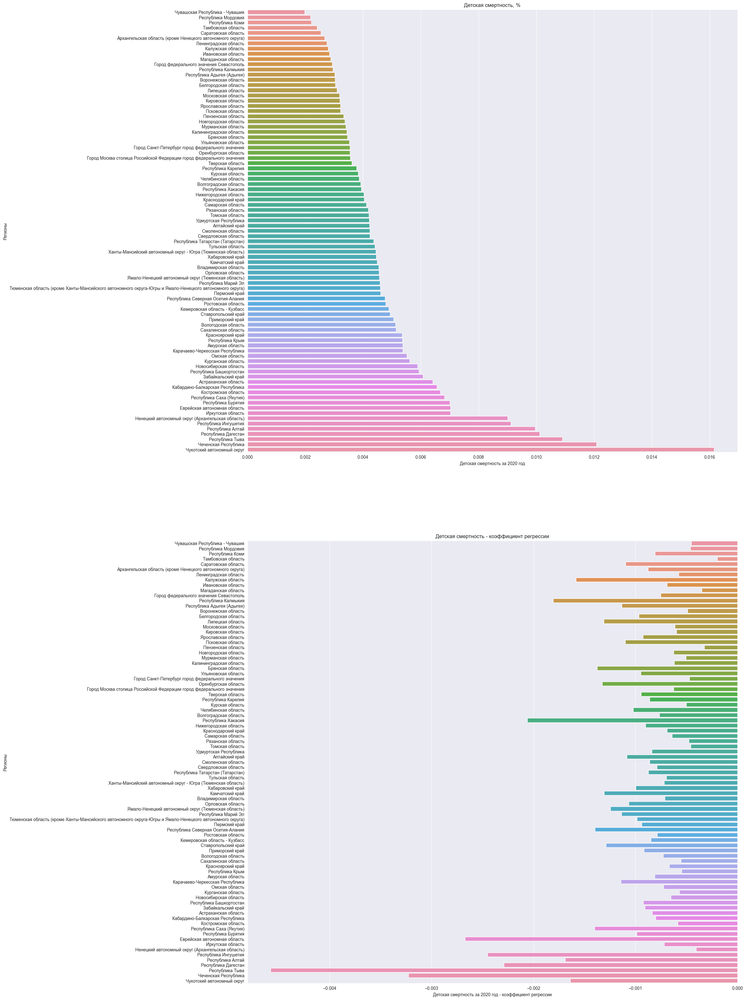

In [113]:
list_title = ['Детская смертность, %',
              'Детская смертность за 2020 год',
              'Регионы',
              'Детская смертность - коэффициент регрессии',
              'Детская смертность за 2020 год - коэффициент регрессии',
              'Регионы']
temp_df = to_finish(child_mortality_df)
visual_df(temp_df, list_title)
temp_df['2020'] = -temp_df['2020']
temp_df['k'] = -temp_df['k']

finish_df = temp_df.copy()


Из графиков можно сделать следующие выводы:<ul>
<li>детская смертность отличается по регионам в несколько раз; выделяется семь регионов &mdash; &laquo;лидеров&raquo; данной статистики</li>
<li>во всех регионах тенденция к уменьшению детской смертности, причем в неблагополучных регионах она более заметна, т.е. положительная тенденция к уменьшению детской смертности есть.</li>
</ul>

C:\Users\mmvvs\AppData\Local\Temp\ipykernel_15520\3873895159.py:67: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



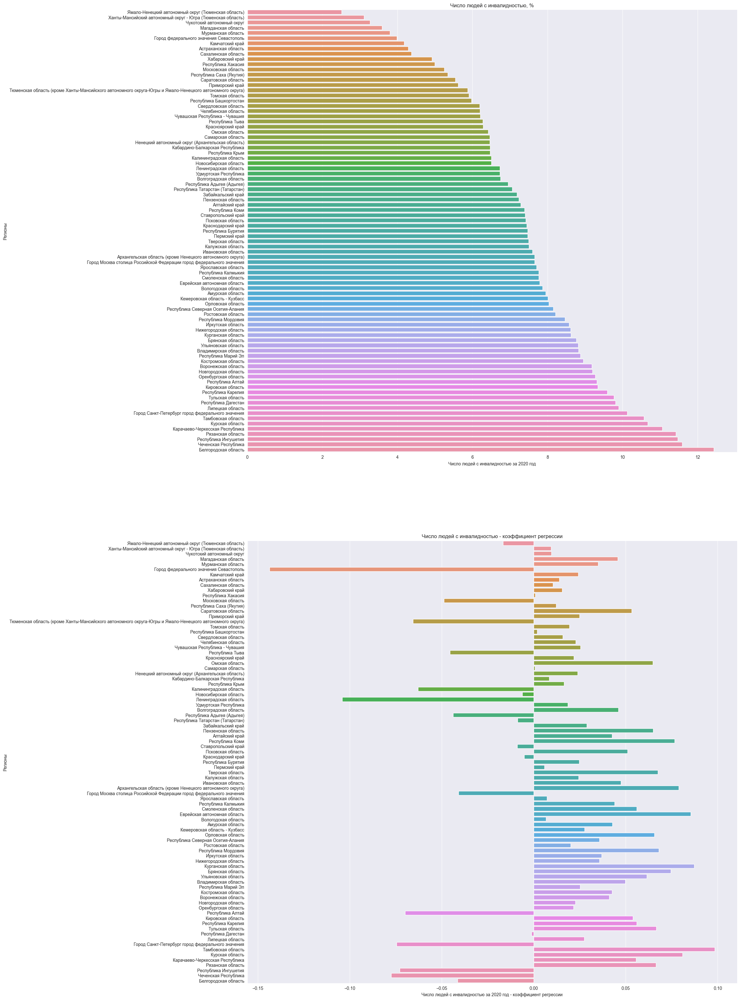

In [114]:
list_title = ['Число людей с инвалидностью, %',
              'Число людей с инвалидностью за 2020 год',
              'Регионы',
              'Число людей с инвалидностью - коэффициент регрессии',
              'Число людей с инвалидностью за 2020 год - коэффициент регрессии',
              'Регионы']

temp_df = to_finish(disabled_total_df)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner', suffixes=('_child', '_disabled'))

visual_df(temp_df, list_title)

finish_df['2020_disabled'] = -finish_df['2020_disabled']
finish_df['k_disabled'] = -finish_df['k_disabled']



В данном случае выводы будут не столь однозначны, как в предыдущем случае. Можно сказать, что количество инвалидов в регионах может отличаться друг от друга в несколько раз. Лидеры по количеству инвалидов есть, но они не так ярко выражены, как в прошлый раз. Если рассмотреть коэффиуиент регрессии, то и здесь все будет выглядеть иначе, чем для предыдущей таблицы. Можно заметить, что от региона к региону коэффициент будет иметь разные знаки, т.е. где-то количестао инвалидов из года в год растет, а в других случаях падает.

C:\Users\mmvvs\AppData\Local\Temp\ipykernel_15520\3873895159.py:67: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



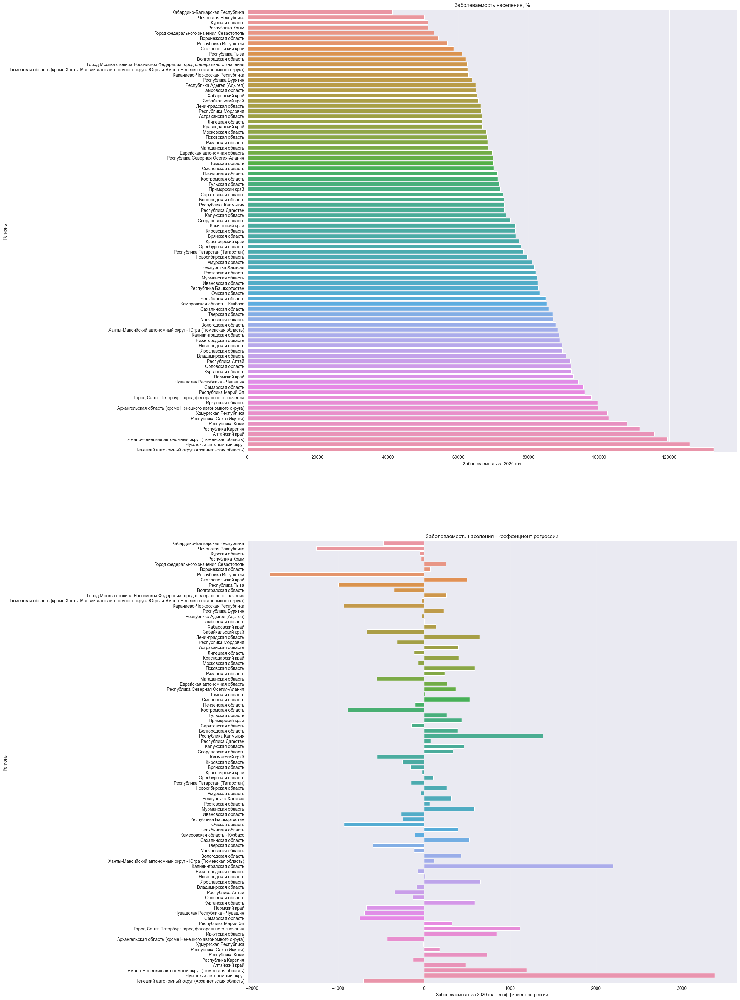

In [115]:
list_title = ['Заболеваемость населения, %',
              'Заболеваемость за 2020 год',
              'Регионы',
              'Заболеваемость населения - коэффициент регрессии',
              'Заболеваемость за 2020 год - коэффициент регрессии',
              'Регионы']

temp_df = to_finish(morbidity_df,100000)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')
finish_df['2020'] = -finish_df['2020']
finish_df['k'] = -finish_df['k']
finish_df.rename(columns={'2020': '2020_morbidity', 'k': 'k_morbidity'}, inplace=True)

visual_df(temp_df, list_title)

Диаграммы получились аналогичны предыдущим: ярко выраженных лидеров нет, в ряде регионов тенденция к снижению уровня заболевания, в части - к увеличению. Отчасти такие результаты можно объяснить тем, что рассматривалось общее количество заболеваний без учета возраста и тяжести, кроме того, данные на 2020 год не были представлены в датасете и являются результатом интерполяции. Попытка получить более свежие данные с сайта статистики не увенчалась успехом, т.к. на сайте представлоены данные за те же года, что и в датасете.

C:\Users\mmvvs\AppData\Local\Temp\ipykernel_15520\3873895159.py:67: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



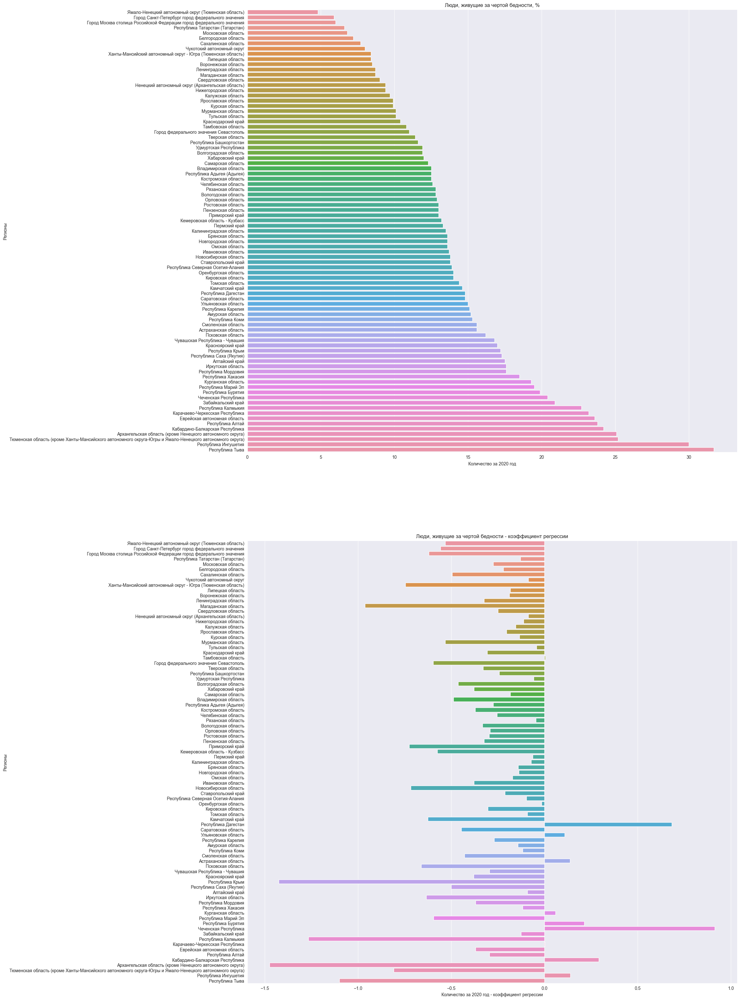

In [116]:
list_title = ['Люди, живущие за чертой бедности, %',
              'Количество за 2020 год',
              'Регионы',
              'Люди, живущие за чертой бедности - коэффициент регрессии',
              'Количество за 2020 год - коэффициент регрессии',
              'Регионы']

temp_df = to_finish(poverty_df,100)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')
finish_df['2020'] = -finish_df['2020']
finish_df['k'] = -finish_df['k']
finish_df.rename(columns={'2020': '2020_poverty', 'k': 'k_poverty'}, inplace=True)

visual_df(temp_df, list_title)

Процент населения, живущего за чертой бедности - самая важная характеристика, которая определяет проблемные регионы. Можно заметить, что здесь есть группа регионов, которые испытывают проблемы. На общем фоне выделяются две республики - Тыва и Ингушетия. Еще хорошо земетна ступенька, начиная с Калмыкии. Особенную тревогу вызывают Ингушетия, где процент малоимущего населения велик, и есть тенденция к его увеличению. Чеченская республика и Дагестан пока находятся не в самом низу таблицы, но имеют тенденцию к обнищанию населения. Все регионы, находящиеся выше Дагестана, т.е. имеющие процент малоимущих меньше, имеют положительную тенденцию к снижению уровня бедности.

Построи коробчатую диаграмму, которая позволит составить некоторое представление о ситуации с населением, живущим за чертой бедности в целом по стране.

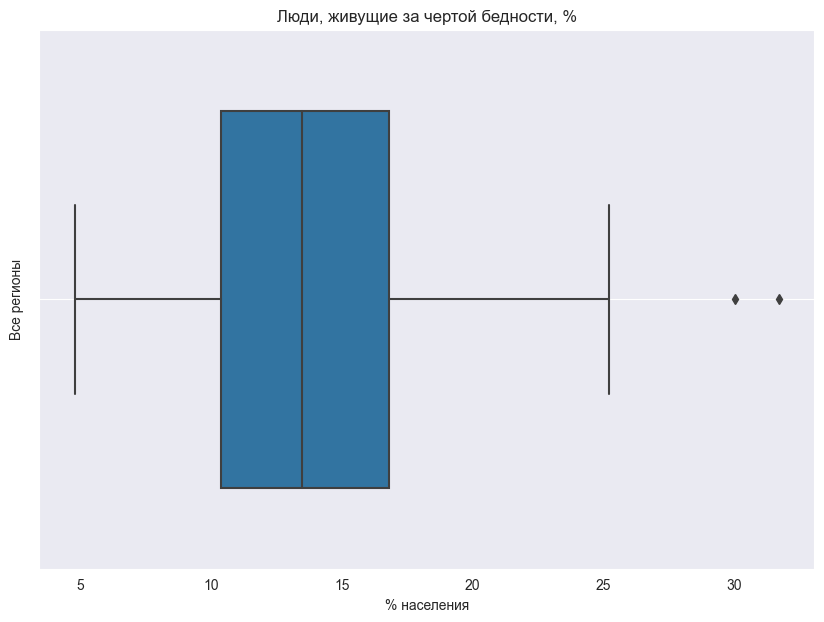

In [117]:
fig = plt.figure(figsize=(10, 7))
boxplot = sns.boxplot(
    data=temp_df,
#    y='country',
    x='2020',
    orient='h',
    width=0.7
)
boxplot.set_title('Люди, живущие за чертой бедности, %');
boxplot.set_xlabel('% населения');
boxplot.set_ylabel('Все регионы');
boxplot.grid()

На диаграмме хорошо видны те два региона (Тыва и Ингушетия), где ситуация совсем плохая. При анализе больших данных их можно было бы посчитать за выбросы и, возможно, удалить. В данном случае это просто показатель ахового состояния дел в регионе. Левый ус отвечает за "богатые" регионы, а правый - за те, которые можно отнести к "бедным". Сама коробка должна включать в себя регионы, в которых уровень бедности можно признать допустимым.

,okato,region,2020,k
0,14000000000,Белгородская область,16.1,0.834286
1,15000000000,Брянская область,23.1,-0.377143
2,17000000000,Владимирская область,26.0,1.574286
3,20000000000,Воронежская область,21.6,1.168571
4,24000000000,Ивановская область,25.1,0.625714
...,...,...,...,...
80,10000000000,Амурская область,21.7,-0.237143
81,44000000000,Магаданская область,11.1,0.314286
82,64000000000,Сахалинская область,16.5,1.705714
83,99000000000,Еврейская автономная область,31.2,2.500000


C:\Users\mmvvs\AppData\Local\Temp\ipykernel_15520\3873895159.py:67: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



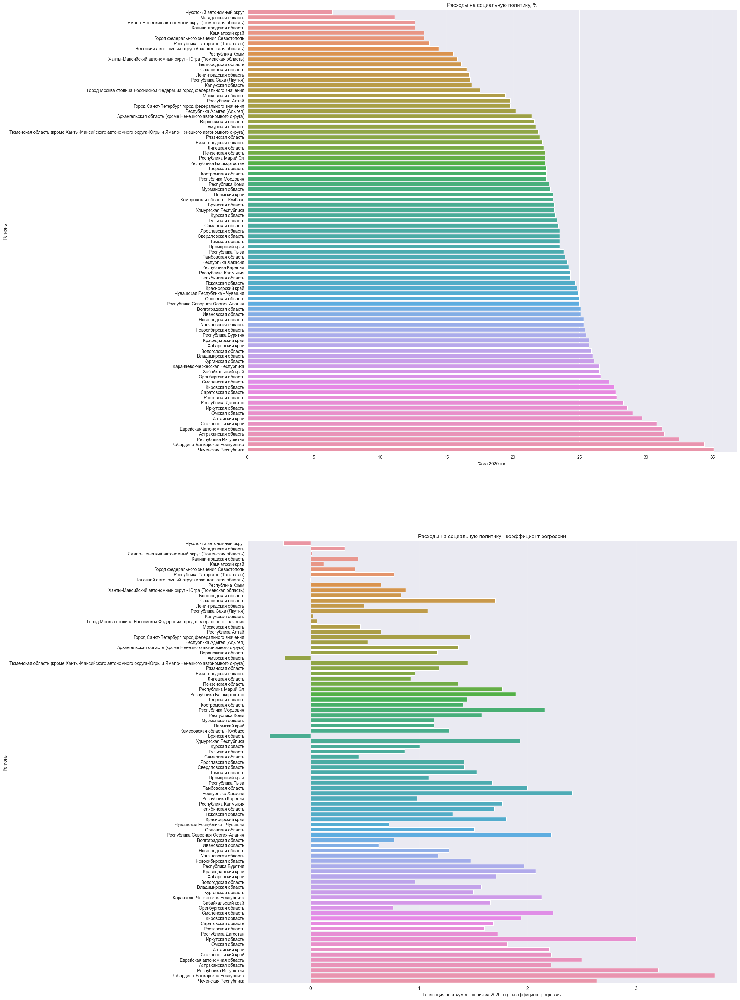

In [118]:
list_title = ['Расходы на социальную политику, %',
              '% за 2020 год',
              'Регионы',
              'Расходы на социальную политику - коэффициент регрессии',
              'Тенденция роста/уменьшения за 2020 год - коэффициент регрессии',
              'Регионы']

temp_df = to_finish(welfare_df,100)
display(temp_df)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')

finish_df.rename(columns={'2020': '2020_welfare', 'k': 'k_welfare'}, inplace=True)

visual_df(temp_df, list_title)



Из представленных диаграмм можно пока заметить только явную тенденцию к увеличению расходов бюджета на социальную политику.Те регионы, в которых расходы имеют тенденцию к уменьшению, не испытывают больших проблем с малоимущим населением.

C:\Users\mmvvs\AppData\Local\Temp\ipykernel_15520\3873895159.py:67: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



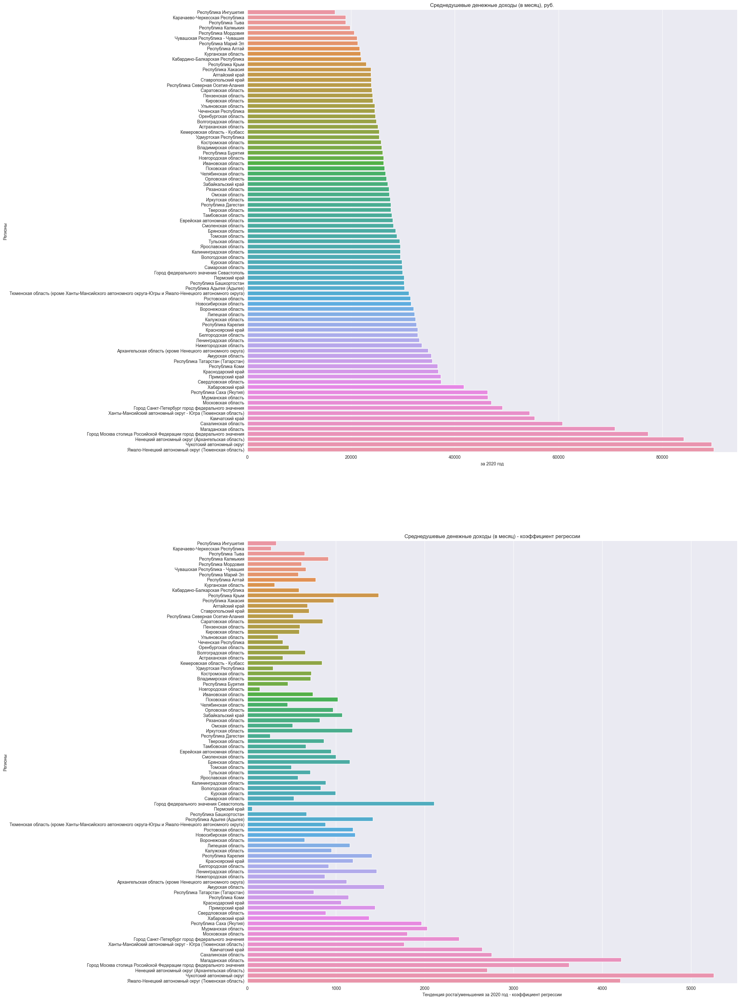

In [119]:
list_title = ['Среднедушевые денежные доходы (в месяц), руб.',
              'за 2020 год',
              'Регионы',
              'Среднедушевые денежные доходы (в месяц) - коэффициент регрессии',
              'Тенденция роста/уменьшения за 2020 год - коэффициент регрессии',
              'Регионы']

cash_df = cash_formal_df[['okato', 'region', '2015', '2016', '2017', '2018', '2019', '2020']]
#cash_df.rename(columns={'2015_c': '2015', '2016_c': '2016', '2017_c': '2017', '2018_c': '2018', '2019_c': '2019', '2020_c': '2020'}, inplace=True)

temp_df = to_finish(cash_df,100)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')

finish_df.rename(columns={'2020': '2020_cash', 'k': 'k_cash'}, inplace=True)

visual_df(temp_df, list_title)


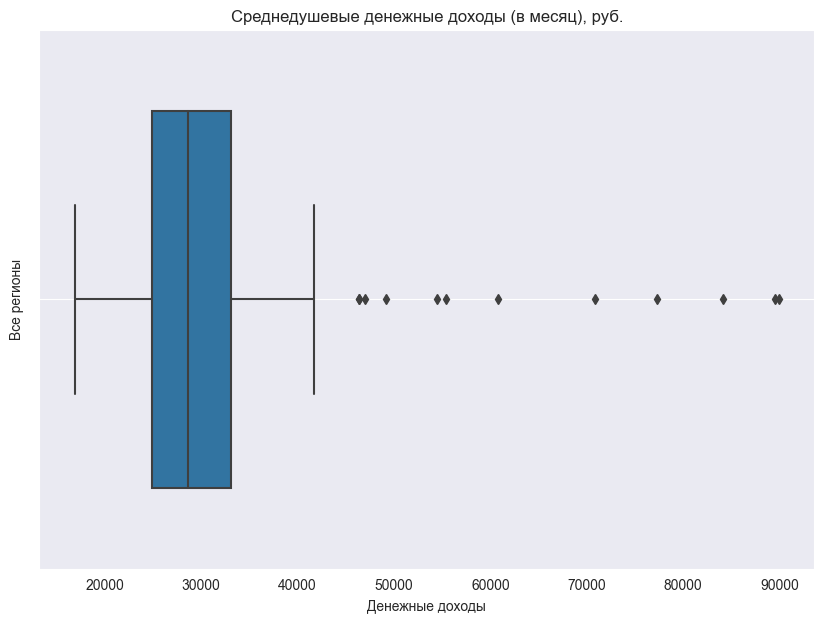

In [120]:
fig = plt.figure(figsize=(10, 7))
boxplot = sns.boxplot(
    data=temp_df,
#    y='country',
    x='2020',
    orient='h',
    width=0.7
)
boxplot.set_title('Среднедушевые денежные доходы (в месяц), руб.');
boxplot.set_xlabel('Денежные доходы');
boxplot.set_ylabel('Все регионы');
boxplot.grid()

В отличие от показателей бедности, здесь наблюдается большой процент регионов, значение душевых доходов в которых лежит правее Q<sub>75</sub>. Шла бы речь о большом объеме данных, можно было бы эти значения отнести к выбросам и удалить, но речь идет о регионах, и это не выборосы, а их "оторванность" от остальной страны. Из диаграммы можно сделать вывод, что "в среднем по палате" среднедушевой доход в месяц находится где-то в районе 28 000 руб.

C:\Users\mmvvs\AppData\Local\Temp\ipykernel_15520\3873895159.py:67: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



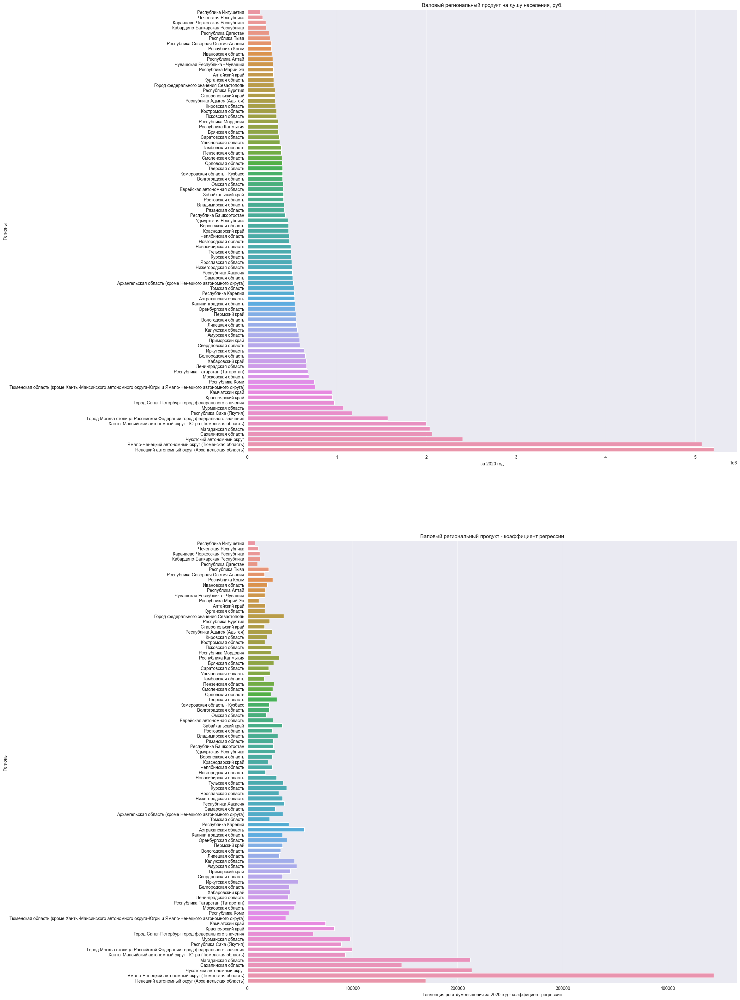

In [121]:
list_title = ['Валовый региональный продукт на душу населения, руб.',
              'за 2020 год',
              'Регионы',
              'Валовый региональный продукт - коэффициент регрессии',
              'Тенденция роста/уменьшения за 2020 год - коэффициент регрессии',
              'Регионы']


temp_df = to_finish(regional_product_df,100)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')

finish_df.rename(columns={'2020': '2020_rp', 'k': 'k_rp'}, inplace=True)

visual_df(temp_df, list_title)



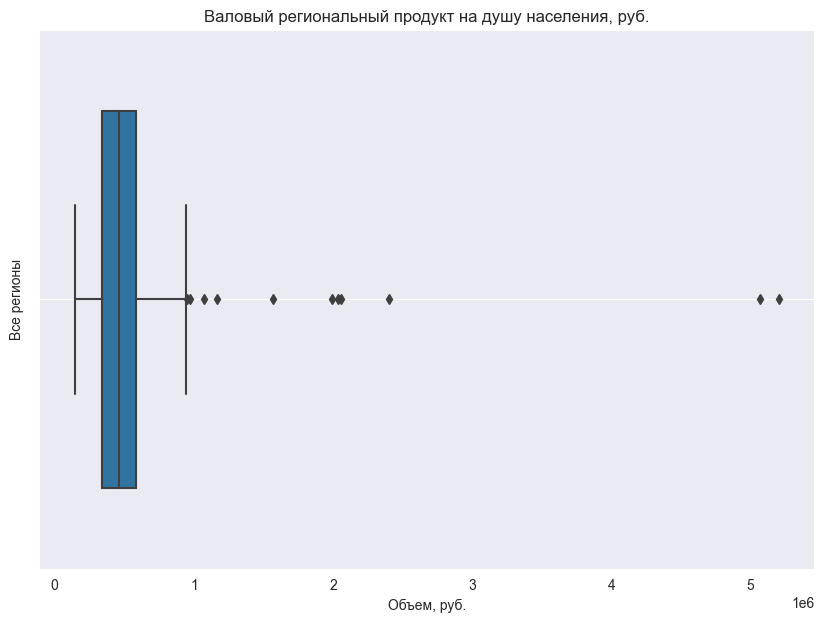

In [122]:
fig = plt.figure(figsize=(10, 7))
boxplot = sns.boxplot(
    data=temp_df,
#    y='country',
    x='2020',
    orient='h',
    width=0.7
)
boxplot.set_title('Валовый региональный продукт на душу населения, руб.');
boxplot.set_xlabel('Объем, руб.');
boxplot.set_ylabel('Все регионы');
boxplot.grid()

И снова мы видим ситуацию, при которой есть несколько регионов, оставивших остальные далеко позади. Остальные регионы расположены достаточно компактно.

C:\Users\mmvvs\AppData\Local\Temp\ipykernel_15520\3873895159.py:67: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



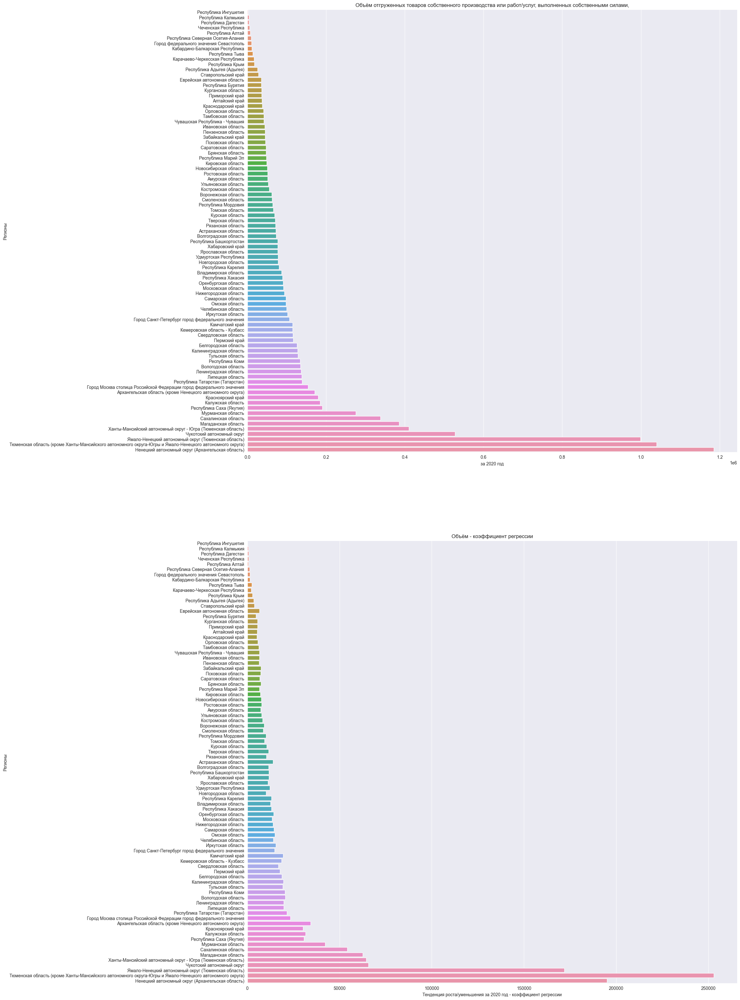

In [123]:
list_title = ['Объём отгруженных товаров собственного производства или работ/услуг, выполненных собственными силами,',
              'за 2020 год',
              'Регионы',
              'Объём - коэффициент регрессии',
              'Тенденция роста/уменьшения за 2020 год - коэффициент регрессии',
              'Регионы']


temp_df = to_finish(product_df)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')

finish_df.rename(columns={'2020': '2020_prod', 'k': 'k_prod'}, inplace=True)

visual_df(temp_df, list_title)


Здесь видны явные "лидеры", не имеющие собственного производства. Они же, как правило, имеют большой процент бедного населения. Севастополь не относится к регионам с бедным населением, но объём товаров/услуг мал, что объясняется статусом города, как военно-морской базы Черноморского флота. В лидерах регионы, где ведётся активная дорбыча полезных ископаемых.

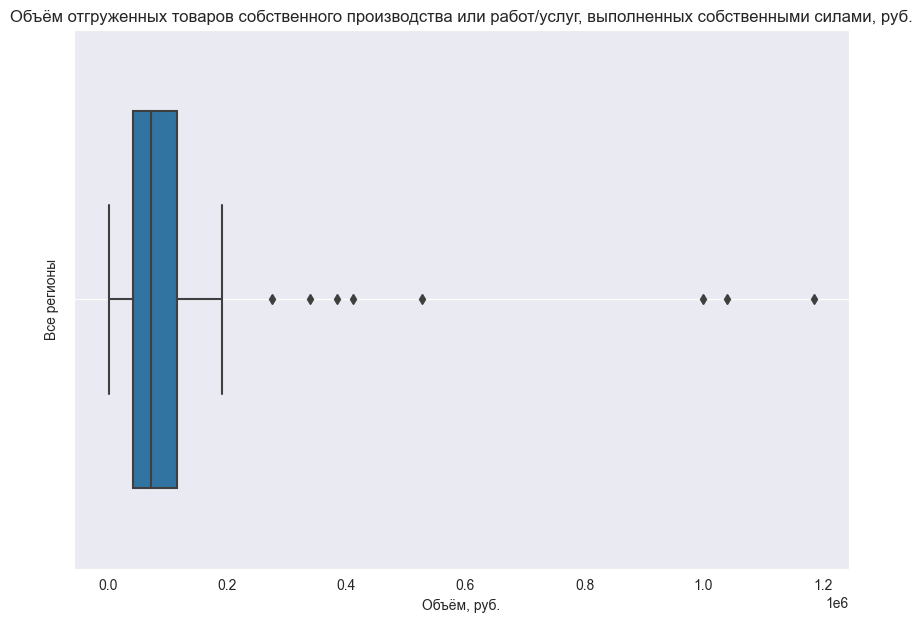

In [124]:
fig = plt.figure(figsize=(10, 7))
boxplot = sns.boxplot(
    data=temp_df,
#    y='country',
    x='2020',
    orient='h',
    width=0.7
)
boxplot.set_title('Объём отгруженных товаров собственного производства или работ/услуг, выполненных собственными силами, руб.');
boxplot.set_xlabel('Объём, руб.');
boxplot.set_ylabel('Все регионы');
boxplot.grid()

Картина очень похожа на предыдущую.

C:\Users\mmvvs\AppData\Local\Temp\ipykernel_15520\3873895159.py:67: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



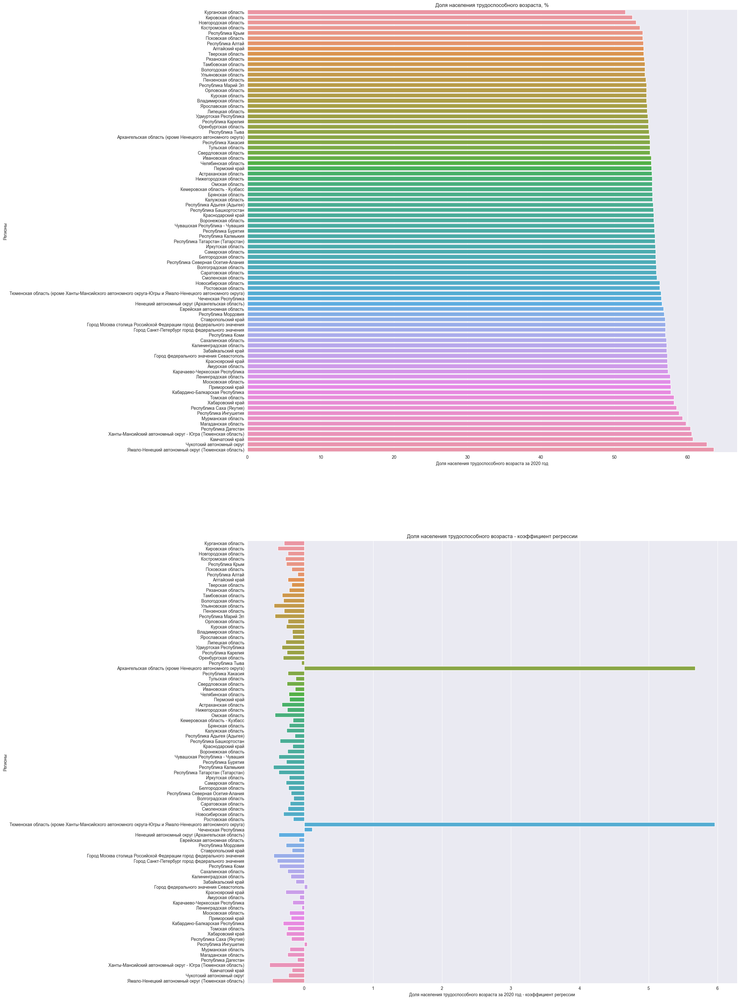

In [125]:
list_title = ['Доля населения трудоспособного возраста, %',
              'Доля населения трудоспособного возраста за 2020 год',
              'Регионы',
              'Доля населения трудоспособного возраста - коэффициент регрессии',
              'Доля населения трудоспособного возраста за 2020 год - коэффициент регрессии',
              'Регионы']
temp_df = to_finish(population_age_work_df)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')
finish_df.rename(columns={'2020': '2020_worker', 'k': 'k_worker'}, inplace=True)

visual_df(temp_df, list_title)


Для большей наглядности сразу рассмотрим данные по доле малоимущего населения трудоспособного возраста

C:\Users\mmvvs\AppData\Local\Temp\ipykernel_15520\3873895159.py:67: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



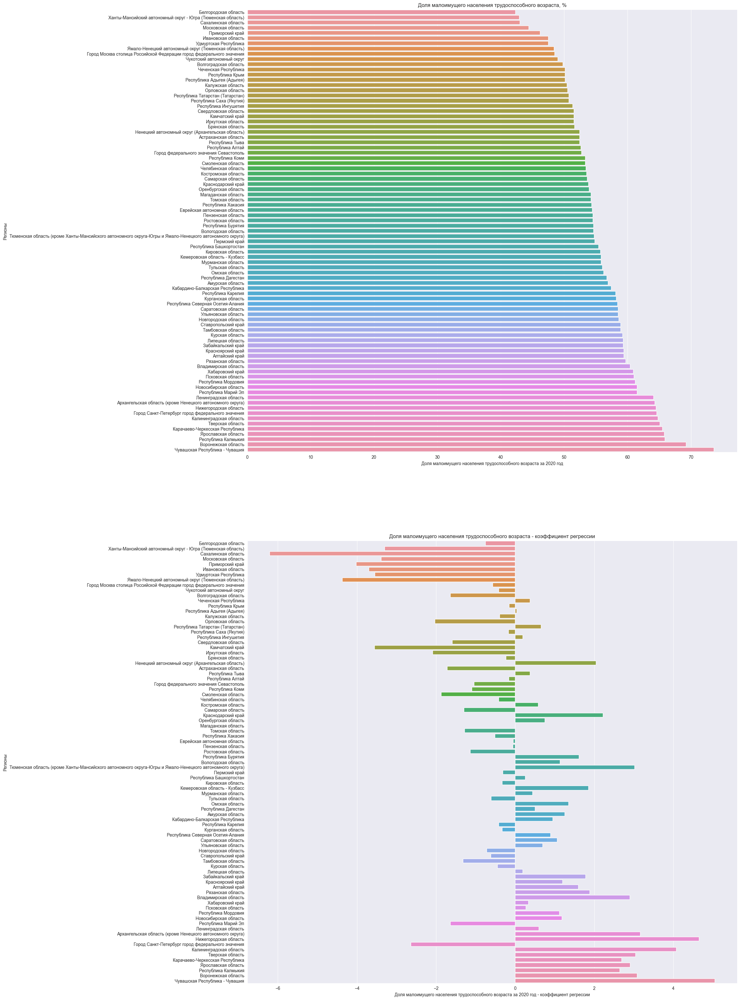

In [126]:
list_title = ['Доля малоимущего населения трудоспособного возраста, %',
              'Доля малоимущего населения трудоспособного возраста за 2020 год',
              'Регионы',
              'Доля малоимущего населения трудоспособного возраста - коэффициент регрессии',
              'Доля малоимущего населения трудоспособного возраста за 2020 год - коэффициент регрессии',
              'Регионы']
temp_df = to_finish2017(poverty_socdem_df,'worker')

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')
finish_df['2020'] = -finish_df['2020']
finish_df['k'] = -finish_df['k']
finish_df.rename(columns={'2020': '2020_s_worker', 'k': 'k_s_worker'}, inplace=True)

visual_df(temp_df, list_title)


C:\Users\mmvvs\AppData\Local\Temp\ipykernel_15520\3873895159.py:67: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



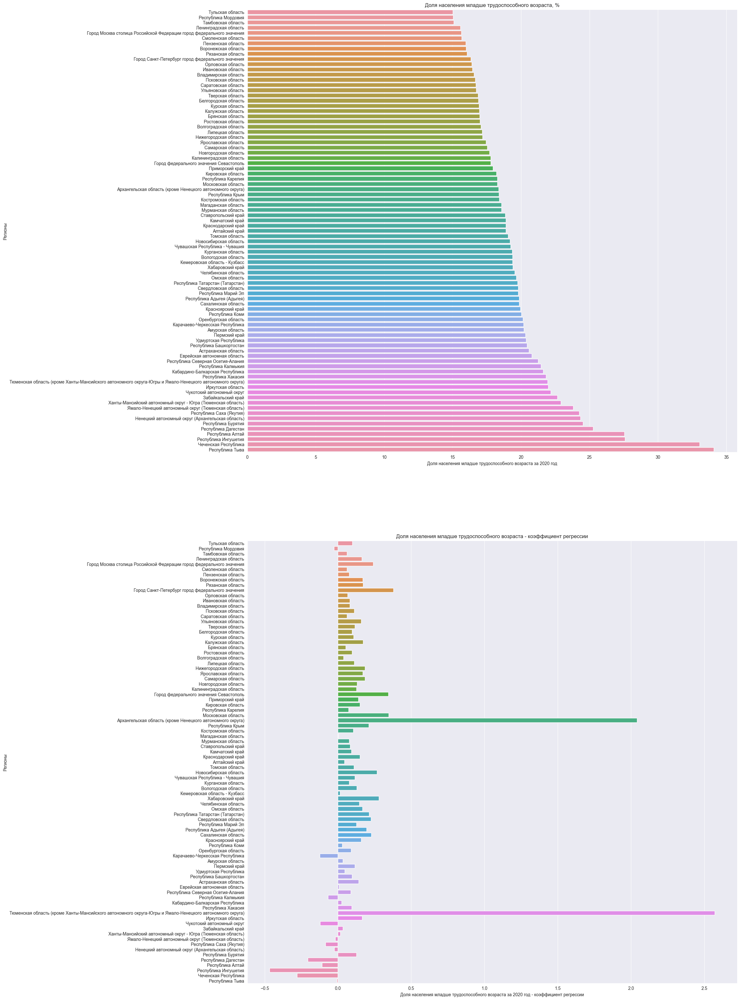

In [127]:
list_title = ['Доля населения младше трудоспособного возраста, %',
              'Доля населения младше трудоспособного возраста за 2020 год',
              'Регионы',
              'Доля населения младше трудоспособного возраста - коэффициент регрессии',
              'Доля населения младше трудоспособного возраста за 2020 год - коэффициент регрессии',
              'Регионы']
temp_df = to_finish(population_age_child_df)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')
finish_df.rename(columns={'2020': '2020_young', 'k': 'k_young'}, inplace=True)

visual_df(temp_df, list_title)


C:\Users\mmvvs\AppData\Local\Temp\ipykernel_15520\3873895159.py:67: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



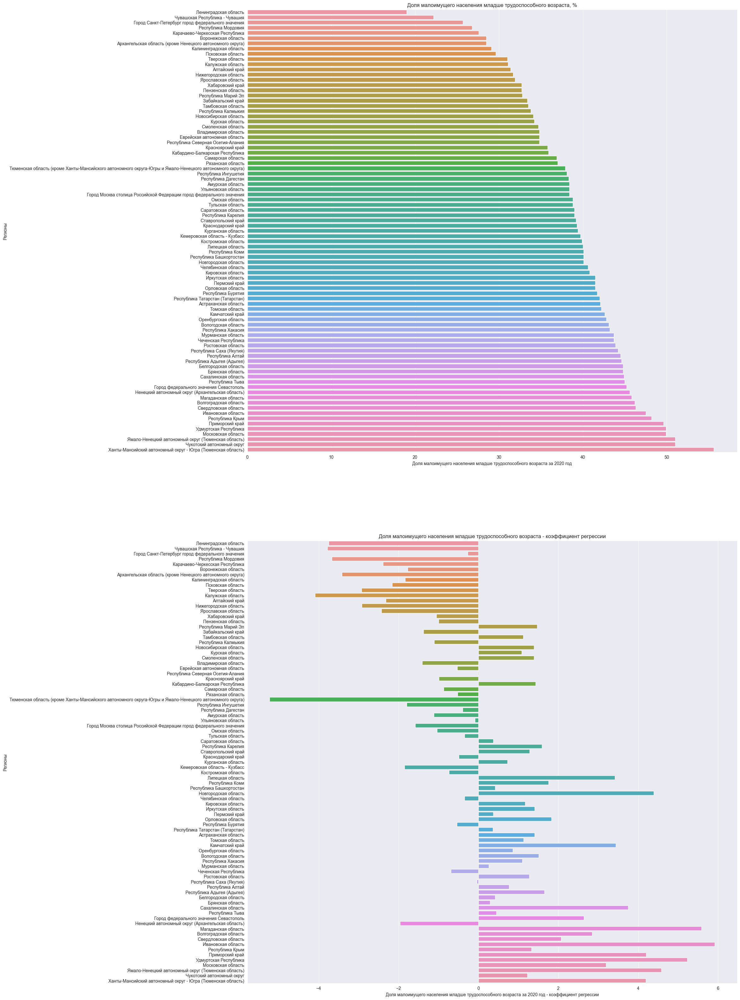

In [128]:
list_title = ['Доля малоимущего населения младше трудоспособного возраста, %',
              'Доля малоимущего населения младше трудоспособного возраста за 2020 год',
              'Регионы',
              'Доля малоимущего населения младше трудоспособного возраста - коэффициент регрессии',
              'Доля малоимущего населения младше трудоспособного возраста за 2020 год - коэффициент регрессии',
              'Регионы']
temp_df = to_finish2017(poverty_socdem_df,'child')

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')
finish_df['2020'] = -finish_df['2020']
finish_df['k'] = -finish_df['k']
finish_df.rename(columns={'2020': '2020_s_child', 'k': 'k_s_child'}, inplace=True)

visual_df(temp_df, list_title)


C:\Users\mmvvs\AppData\Local\Temp\ipykernel_15520\3873895159.py:67: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



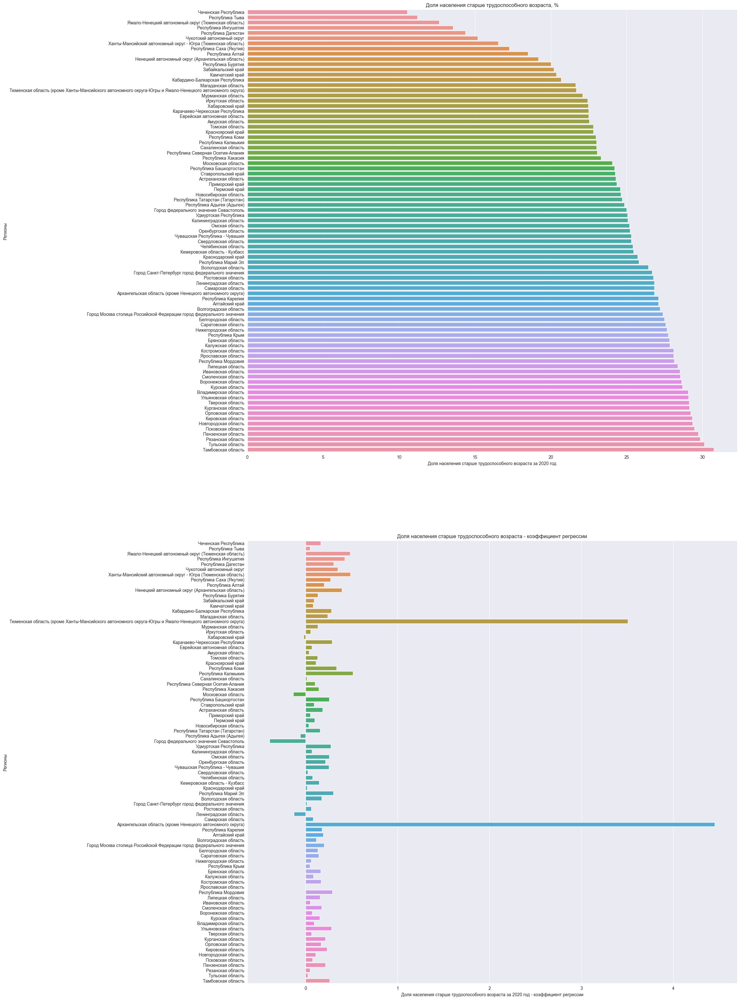

In [129]:
list_title = ['Доля населения старше трудоспособного возраста, %',
              'Доля населения старше трудоспособного возраста за 2020 год',
              'Регионы',
              'Доля населения старше трудоспособного возраста - коэффициент регрессии',
              'Доля населения старше трудоспособного возраста за 2020 год - коэффициент регрессии',
              'Регионы']
temp_df = to_finish(population_age_old_df)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')
finish_df.rename(columns={'2020': '2020_old', 'k': 'k_old'}, inplace=True)

visual_df(temp_df, list_title)

C:\Users\mmvvs\AppData\Local\Temp\ipykernel_15520\3873895159.py:67: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



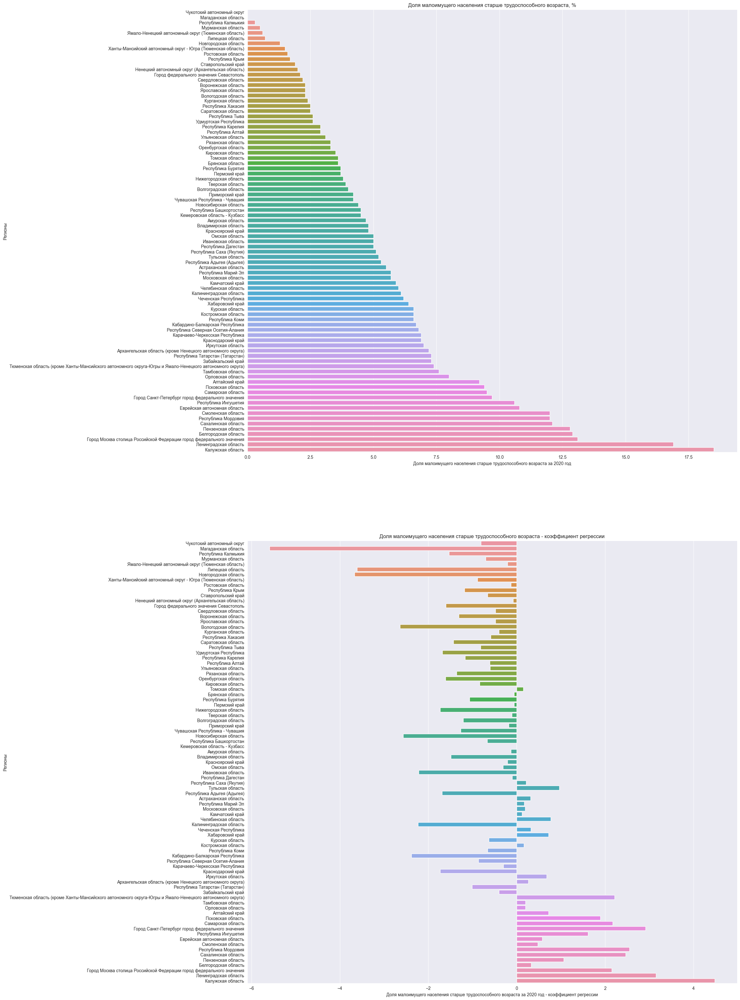

In [130]:
list_title = ['Доля малоимущего населения старше трудоспособного возраста, %',
              'Доля малоимущего населения старше трудоспособного возраста за 2020 год',
              'Регионы',
              'Доля малоимущего населения старше трудоспособного возраста - коэффициент регрессии',
              'Доля малоимущего населения старше трудоспособного возраста за 2020 год - коэффициент регрессии',
              'Регионы']
temp_df = to_finish2017(poverty_socdem_df,'retiree')

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')
finish_df['2020'] = -finish_df['2020']
finish_df['k'] = -finish_df['k']
finish_df.rename(columns={'2020': '2020_s_retiree', 'k': 'k_s_retiree'}, inplace=True)

visual_df(temp_df, list_title)

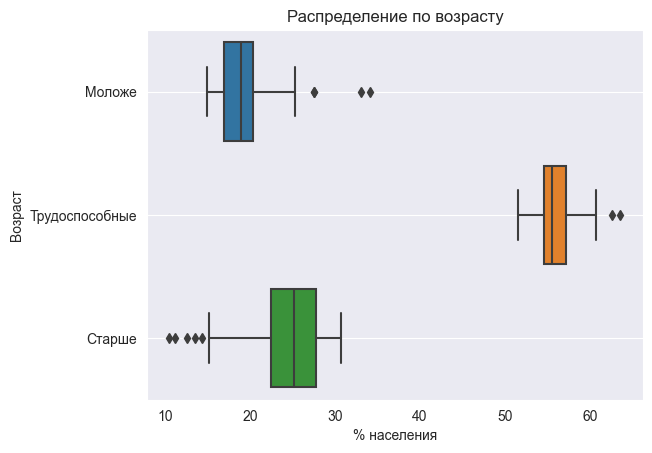

In [131]:
b = sns.boxplot(y="variable", x="value", data=pd.melt(finish_df, id_vars=['okato'], value_vars=['2020_young', '2020_worker', '2020_old']), orient='h')
b.set_title('Распределение по возрасту');
b.set_xlabel('% населения');
b.set_ylabel('Возраст');
#b.set_yticks(range(3)) 
b.set_yticklabels(['Моложе','Трудоспособные','Старше'])
b.grid()

Пока ничего интересного из этой диаграммы не получить. Всё, что можно сказать, что количество людей старшего возраста превышает количество молодых, т.е. население стареет.

C:\Users\mmvvs\AppData\Local\Temp\ipykernel_15520\3873895159.py:67: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



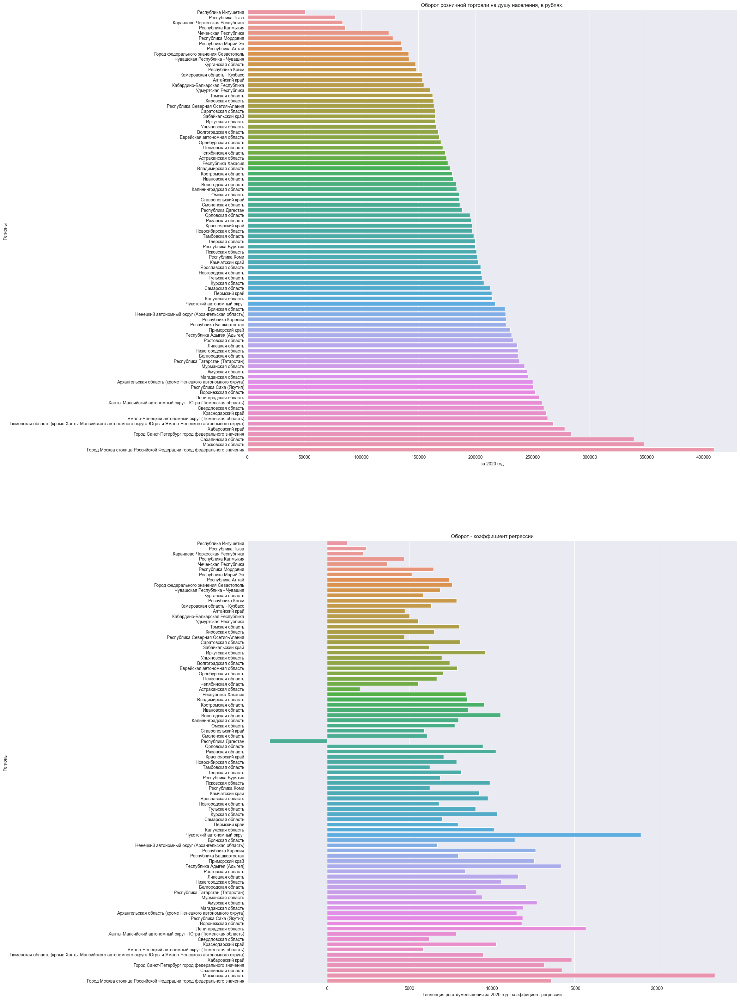

In [132]:
list_title = ['Оборот розничной торговли на душу населения, в рублях.',
              'за 2020 год',
              'Регионы',
              'Оборот - коэффициент регрессии',
              'Тенденция роста/уменьшения за 2020 год - коэффициент регрессии',
              'Регионы']


temp_df = to_finish(retail_df,100)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')

finish_df.rename(columns={'2020': '2020_retail', 'k': 'k_retail'}, inplace=True)

visual_df(temp_df, list_title)


Лидеры и отстающие все на месте. Тыва и Ингушетия имеют худшие показатели, а Москва &mdash; лидер.

C:\Users\mmvvs\AppData\Local\Temp\ipykernel_15520\3873895159.py:67: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



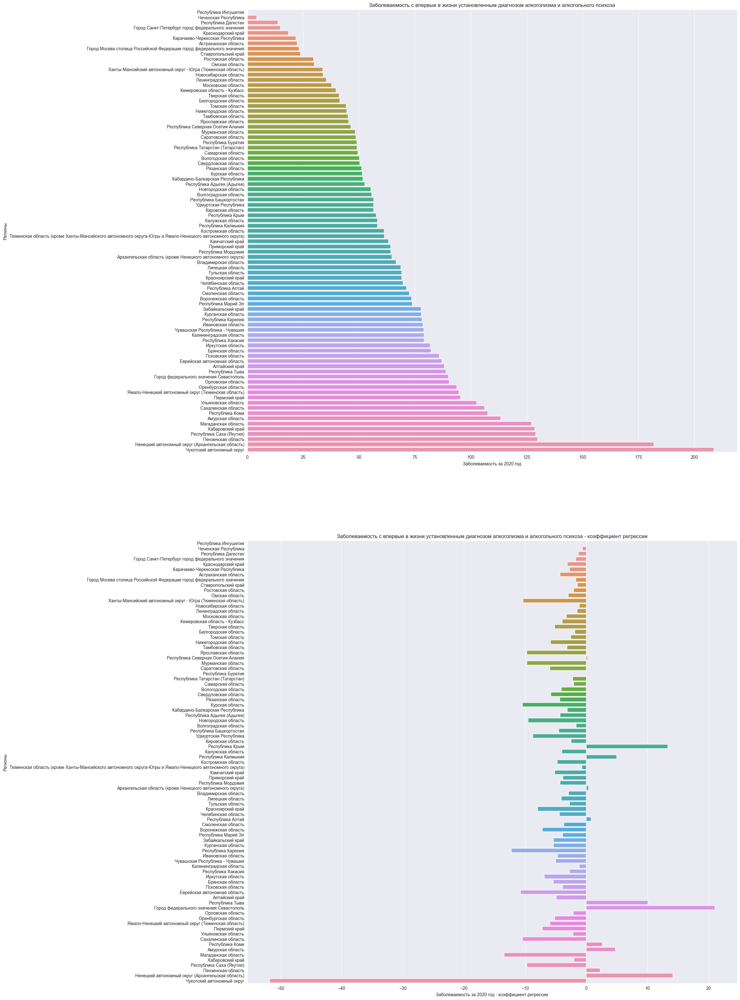

In [133]:
list_title = ['Заболеваемость с впервые в жизни установленным диагнозом алкоголизма и алкогольного психоза',
              'Заболеваемость за 2020 год',
              'Регионы',
              'Заболеваемость с впервые в жизни установленным диагнозом алкоголизма и алкогольного психоза - коэффициент регрессии',
              'Заболеваемость за 2020 год - коэффициент регрессии',
              'Регионы']

temp_df = to_finish(alco_df,1000)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')
finish_df['2020'] = -finish_df['2020']
finish_df['k'] = -finish_df['k']
finish_df.rename(columns={'2020': '2020_alco', 'k': 'k_alco'}, inplace=True)

visual_df(temp_df, list_title)
finish_df.to_excel('out/finish_top.xlsx') # stop 20231029

C:\Users\mmvvs\AppData\Local\Temp\ipykernel_15520\3873895159.py:67: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



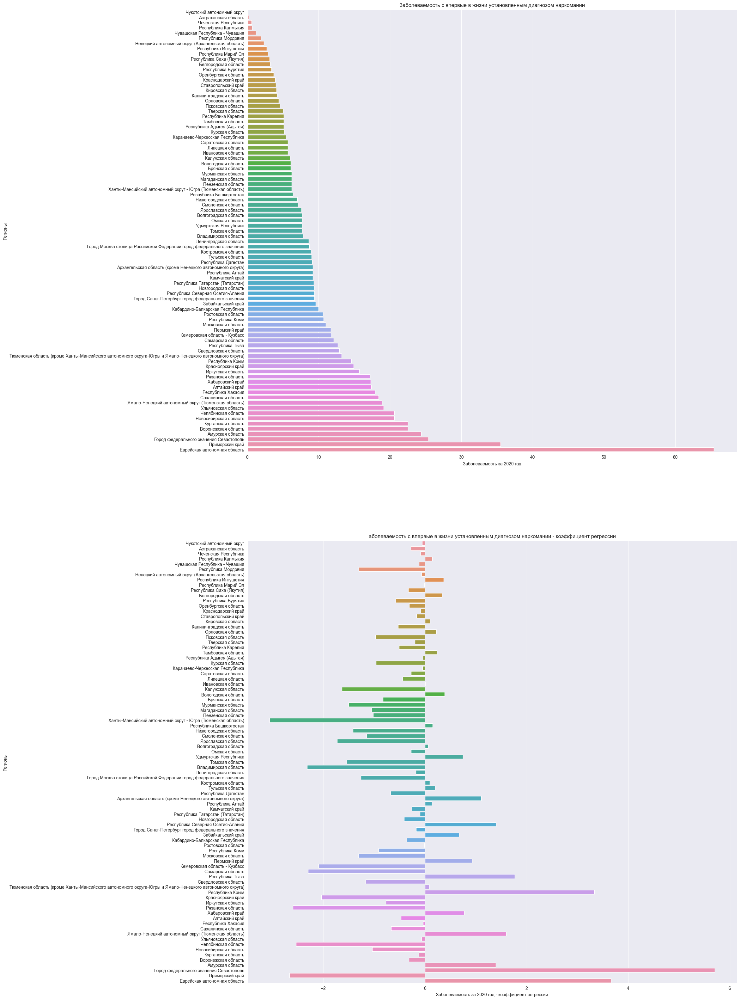

In [134]:
list_title = ['Заболеваемость с впервые в жизни установленным диагнозом наркомании',
              'Заболеваемость за 2020 год',
              'Регионы',
              'аболеваемость с впервые в жизни установленным диагнозом наркомании - коэффициент регрессии',
              'Заболеваемость за 2020 год - коэффициент регрессии',
              'Регионы']

temp_df = to_finish(drug_df,1000)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')
finish_df['2020'] = -finish_df['2020']
finish_df['k'] = -finish_df['k']
finish_df.rename(columns={'2020': '2020_drug', 'k': 'k_drug'}, inplace=True)

visual_df(temp_df, list_title)

Исходя из полученных диаграмм можно говорить о том, что алкоголизм и наркомания более связана с региональными/национальными особенностями и не дают какой-то прямой связи с уровнем жизни населения.

C:\Users\mmvvs\AppData\Local\Temp\ipykernel_15520\3873895159.py:67: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



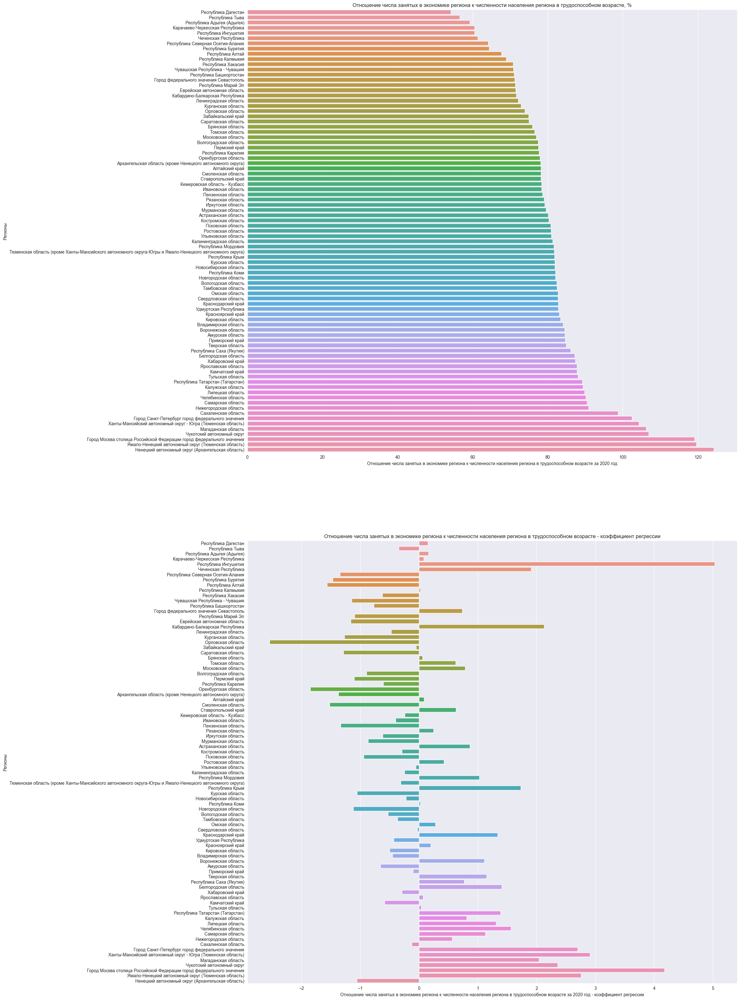

In [135]:
list_title = ['Отношение числа занятых в экономике региона к численности населения региона в трудоспособном возрасте, %',
              'Отношение числа занятых в экономике региона к численности населения региона в трудоспособном возрасте за 2020 год',
              'Регионы',
              'Отношение числа занятых в экономике региона к численности населения региона в трудоспособном возрасте - коэффициент регрессии',
              'Отношение числа занятых в экономике региона к численности населения региона в трудоспособном возрасте за 2020 год - коэффициент регрессии',
              'Регионы']
temp_df = to_finish(workers_df,100)
finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')
finish_df.rename(columns={'2020': '2020_workers', 'k': 'k_workers'}, inplace=True)
visual_df(temp_df, list_title)

В диаграмме есть небольшая странность: целый ряд регионов имеет отношение числа занятых в экономике региона к численности населения региона в трудоспособном возрасте больше 100%. Такой результат можно объяснить только большой долей труда пенсионеров, учетом работающих на "удаленке", или использованием детского труда. При всей странности данного показателя ему есть вполне логичные объяснения.

<h3>Построение модели</h3>

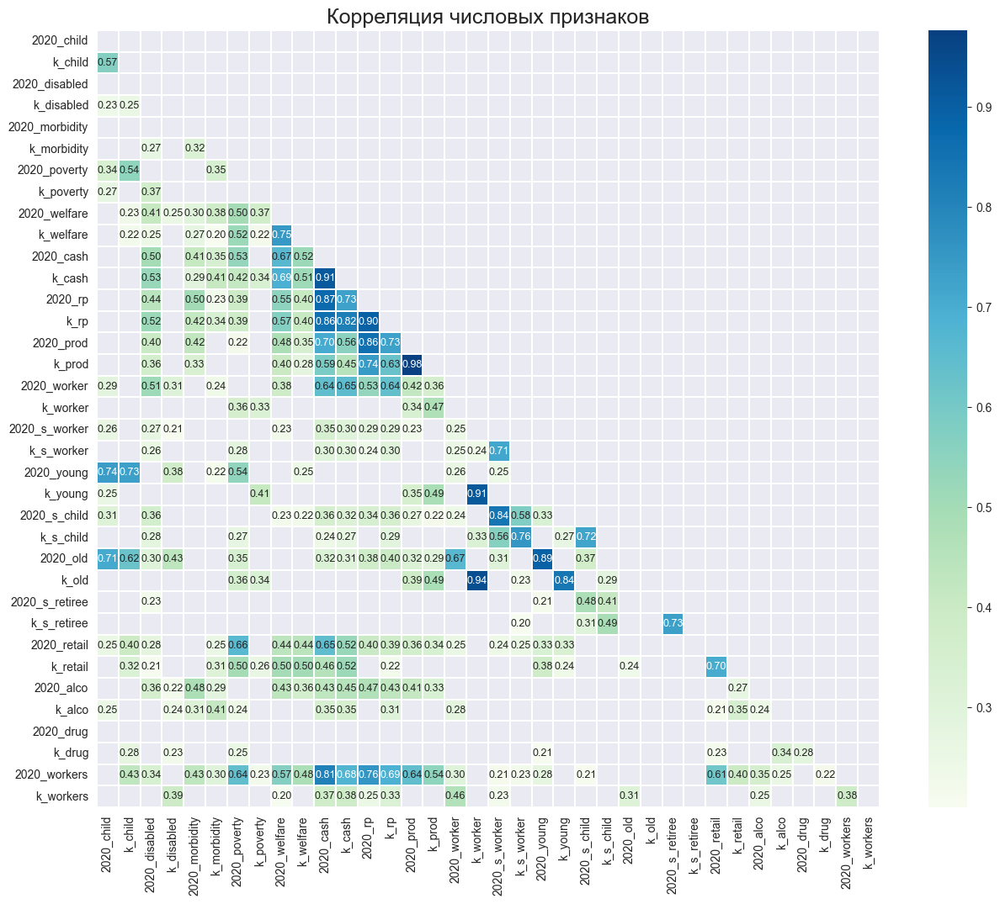

In [136]:
def chart_correlation_heatmap(df, 
                              columns, 
                              title, 
                              method='pearson', 
                              correlation_threshold=.6):
    """Построение корреляционной диаграммы"""
    fig_, ax_ = plt.subplots(figsize=(15, 12))
    correlation_matrix = df[columns].corr(method=method).abs()
    mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
    sns.heatmap(correlation_matrix[correlation_matrix.abs() > correlation_threshold], 
                annot=True,
                annot_kws={"fontsize":9}, 
                linewidths=0.1, 
                ax=ax_, 
                mask=mask, 
                cmap='GnBu',
                fmt='.2f')
    ax_.set_title(title, fontsize=18)
    plt.show()

df = finish_df.select_dtypes(include=np.number)
numerical_columns = df.columns

chart_correlation_heatmap(df, 
                          numerical_columns, 
                          'Корреляция числовых признаков',
                          correlation_threshold = .2)

In [137]:
df1 = df.copy() # ничего интересного, просто способ отладки, позволяющий получить датасет, не подвергшийся какой-либо модификации.

In [138]:
scaler = preprocessing.MinMaxScaler(feature_range=(-1, 1))
scaler.fit(df)
rfm_table_scaled = scaler.transform(df)

tsne = TSNE(n_components=2, perplexity=50, random_state=42)

rfm_table_processed = pd.DataFrame(data = tsne.fit_transform(rfm_table_scaled), columns=['axis-1','axis-2'])
display(round(tsne.kl_divergence_,2))

0.11

<AxesSubplot: xlabel='axis-1', ylabel='axis-2'>

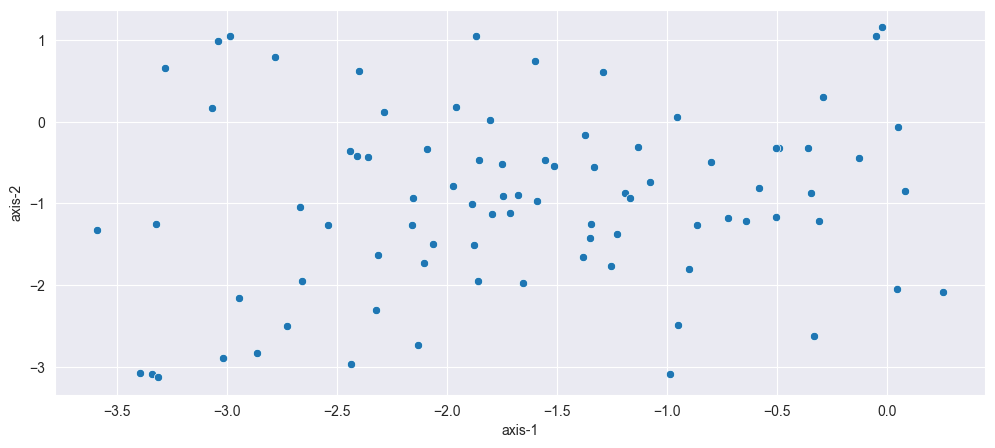

In [139]:
fig = plt.figure(figsize=(12, 5))
sns.scatterplot(data=rfm_table_processed, x='axis-1', y='axis-2')

Для нахождения оптимального количества кластеров используем метод силуэта<br />
Применим его последовательно к алгоритмам k-means, Gaussian Mixture Model и агломеративном.

K-Means

Попробуем определить оптимальное количество кластеров, используя метод локтя.

c:\Users\mmvvs\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\mmvvs\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\mmvvs\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\mmvvs\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warni

<AxesSubplot: xlabel='cluster', ylabel='inertia'>

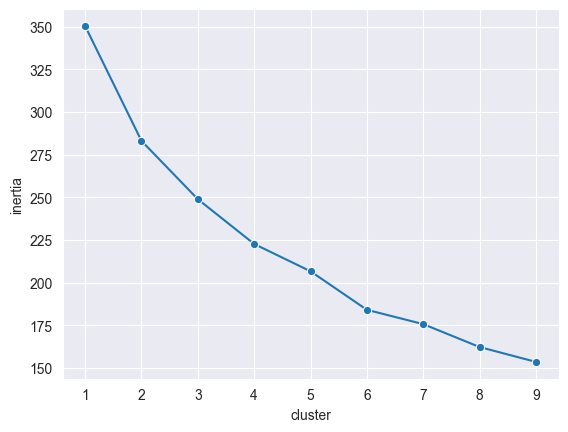

In [140]:
df = df1.copy()
X = df.values
scaler = MinMaxScaler(feature_range=(-1, 1))
scaler.fit(X)
X_norm = scaler.transform(X)

def get_inertia(cluster_num, X):
    k_means =  KMeans(n_clusters=cluster_num, random_state=42)
    k_means.fit(X_norm)
    inertia = k_means.inertia_
    return inertia

res = {"inertia": [], "cluster": []}


for cluster_num in range(1, 10):
    res["inertia"].append(get_inertia(cluster_num, X_norm))
    res["cluster"].append(cluster_num)

res_df = pd.DataFrame(res)

sns.set_style("darkgrid")
sns.lineplot(data=res_df, x="cluster", y="inertia", marker= "o")

Из получившегося графика довольно трудно определить количество кластеров.

c:\Users\mmvvs\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\mmvvs\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\mmvvs\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\mmvvs\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warni

0.36023633753440787

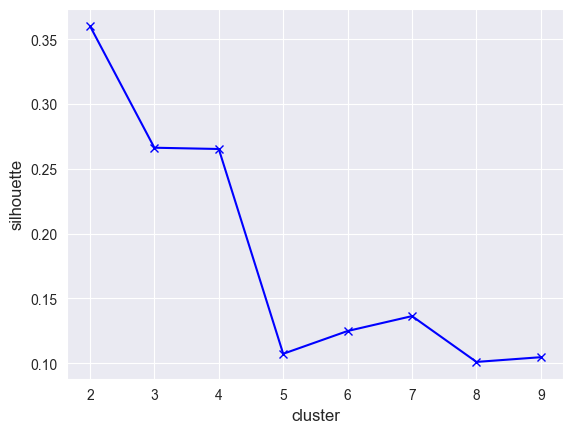

In [141]:
df = df1.copy()
X = df.values
scaler = MinMaxScaler(feature_range=(-1, 1))
scaler.fit(X)
X_norm = scaler.transform(X)

def get_silhouette(cluster_num, X):
    k_means =  KMeans(n_clusters=cluster_num, random_state=42)
    k_means.fit(X)
    silhouette = silhouette_score(X, k_means.labels_, metric='euclidean')
    return silhouette

silhouettes = []
for i in range(2, 10):
    silhouettes.append(get_silhouette(i, X_norm))

display(max(silhouettes))
plt.xlabel("cluster", fontsize=12)
plt.ylabel("silhouette", fontsize=12)
plt.plot([i for i in range(2, 10)], silhouettes, 'xb-')

GMM

0.34

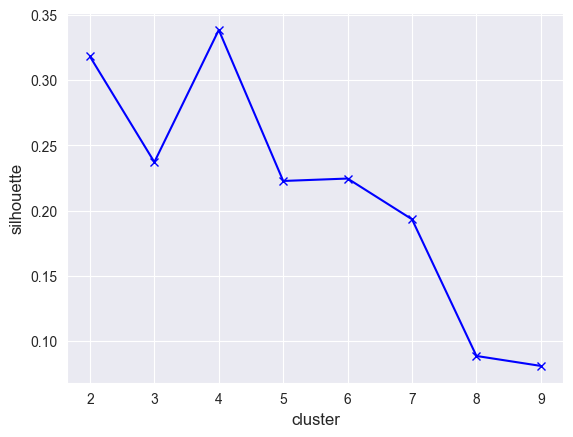

In [142]:
gmm_df = df1.copy()
X = gmm_df.values
scaler = StandardScaler()
scaler.fit(X)
X_norm = scaler.transform(X)

def get_silhouetteG(cluster_num, X):
    gm = GaussianMixture(n_components=cluster_num, random_state=42)
    gm.fit(X)
    silhouette = silhouette_score(X, gm.predict(X), metric='euclidean')
    return silhouette

silhouettes = []
for i in range(2, 10):
    silhouettes.append(get_silhouetteG(i, X_norm))
    
display(round(max(silhouettes),2))
plt.xlabel("cluster", fontsize=12)
plt.ylabel("silhouette", fontsize=12)
plt.plot([i for i in range(2, 10)], silhouettes, 'xb-')

AgglomerativeClustering

0.29581805664441374

2

0.20335798737741773

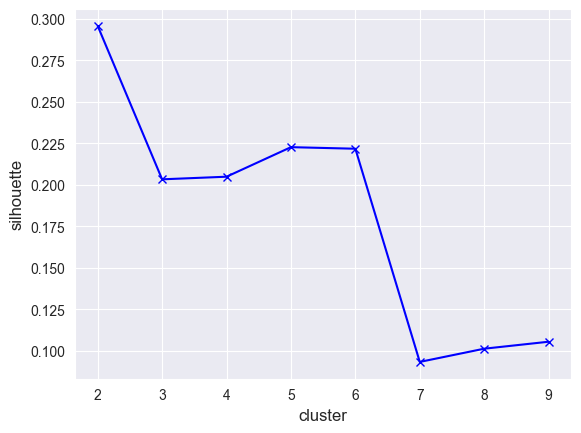

In [143]:
df = df1.copy()
X = df.values
scaler = MinMaxScaler(feature_range=(-1, 1))
scaler.fit(X)
X_norm = scaler.transform(X)

def get_silhouette_AC(cluster_num, X):
    k_AC =  AgglomerativeClustering(n_clusters=cluster_num)
    k_AC.fit(X)
    silhouette = silhouette_score(X, k_AC.labels_, metric='euclidean')
    return silhouette

silhouettes = []
min_silhouette = 0
min_samples_obr = 0
for i in range(2, 10):
    s = get_silhouette_AC(i, X_norm)
    silhouettes.append(s)
    if i == 3:
        m3_sh = s
    if s > min_silhouette:
            min_silhouette = s
            min_samples_obr = i
display(min_silhouette)
display(min_samples_obr)
display(m3_sh)
plt.xlabel("cluster", fontsize=12)
plt.ylabel("silhouette", fontsize=12)
plt.plot([i for i in range(2, 10)], silhouettes, 'xb-')

Из трёх алгоритмов наилучший показатель у агломеративной иерархической кластеризации. Количество рекомендованных данным алгоритмом кластеров &mdash; 5. Это несколько больше, чем хочется, т.к. на первый взгляд оптимальное количество кластеров &mdash; 3 (бедные регионы, богатые регионы и все остальные).<br />Два других алгоритма предлагают количество кластеров, равное двум и четырём.


Построим модель на основе агломеративной иерархической кластеризации с количеством кластеров, равным 5.

In [144]:
cluster_num = 5
k_AC =  AgglomerativeClustering(n_clusters=cluster_num, linkage='ward')

cluster_AC = k_AC.fit_predict(X_norm)
df.loc[:, 'label_ac'] = cluster_AC
display(df['label_ac'].value_counts())
f_df = finish_df.merge(df, left_index=False, right_index=False)
f_df.to_excel('out/finish_ac3.xlsx')
print(silhouette_score(X_norm, cluster_AC))


1    56
0    12
2    12
3     3
4     2
Name: label_ac, dtype: int64

0.22274267185971833


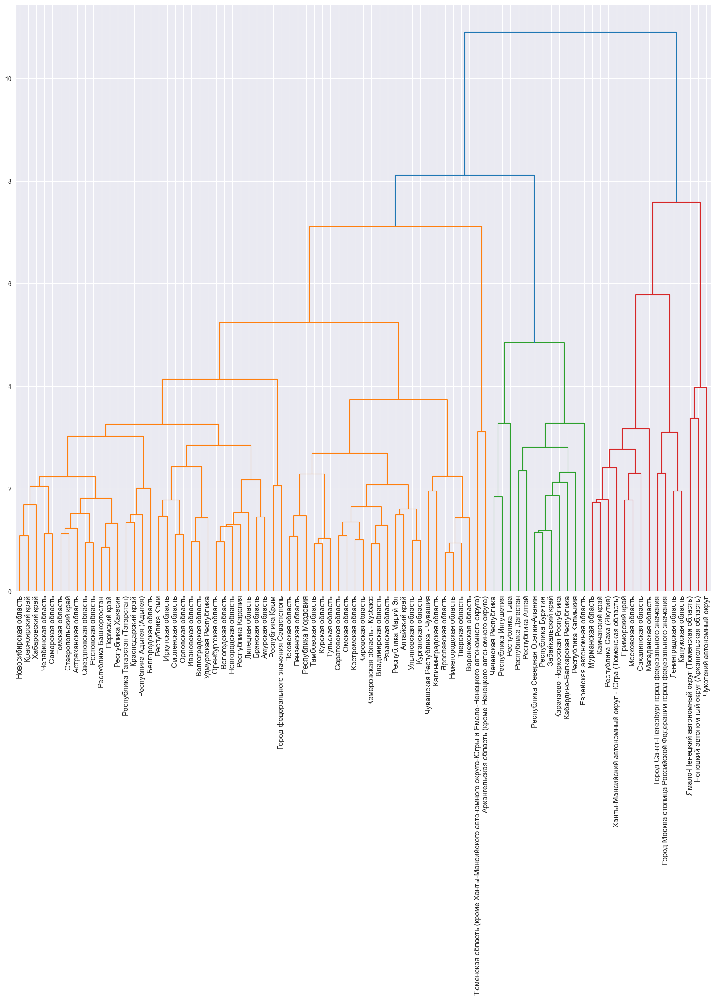

In [145]:
from scipy.cluster.hierarchy import dendrogram, linkage
linked = linkage(X_norm, 'ward')

plt.figure(figsize=(20, 17))

# визуализируем дендрограмму с ориентацией top
# сначала будут отрисовываться кластеры с минимальным расстоянием между друг другом
dendrogram(Z=linked,
            orientation='top',
            labels=f_df['region'].to_list(),
            distance_sort='descending',
            leaf_rotation=90, leaf_font_size=12)

plt.show()

Результаты пока не очень интересные. Получившиеся бедными регионы соответствуют этому статусу, но их очень мало. Реальность не может быть такой оптимиститчной. Попробуем еще два варианта: спектральная кластеризация и ансамблевый метод.

SpectralClustering

0.412935567355514

4

0.35042860488407046

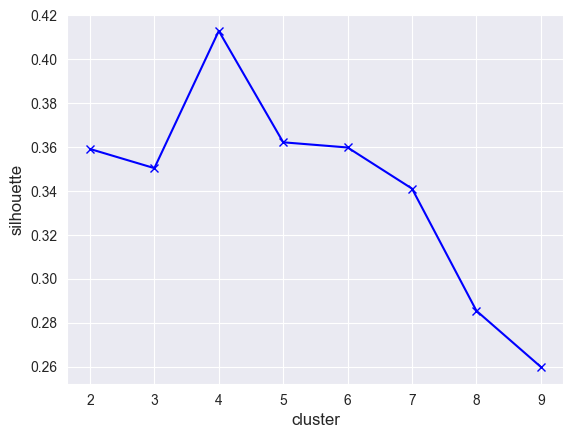

In [146]:
from sklearn.cluster import SpectralClustering

df = df1.copy()
X = df.values
scaler = MinMaxScaler(feature_range=(-1, 1))
scaler.fit(X)
X_norm = scaler.transform(X)

def get_silhouette_SC(cluster_num, X):
    k_SC =  SpectralClustering(n_clusters=cluster_num)
    k_SC.fit(X)
    silhouette = silhouette_score(X, k_SC.labels_, metric='euclidean')
    return silhouette

silhouettes = []
min_silhouette = 0
min_samples_obr = 0
for i in range(2, 10):
    s = get_silhouette_SC(i, X_norm)
    silhouettes.append(s)
    if i == 3:
        m3_sh = s
    if s > min_silhouette:
            min_silhouette = s
            min_samples_obr = i
display(min_silhouette)
display(min_samples_obr)
display(m3_sh)
plt.xlabel("cluster", fontsize=12)
plt.ylabel("silhouette", fontsize=12)
plt.plot([i for i in range(2, 10)], silhouettes, 'xb-')

Метод силуэта дает оптимальным вариант с четырьмя кластерами.

In [147]:
df = df1.copy()
X = df.values
scaler = MinMaxScaler(feature_range=(-1, 1))
scaler.fit(X)
X_norm = scaler.transform(X)
sp_clustering = SpectralClustering(n_clusters = 4, affinity ='nearest_neighbors', random_state=42, assign_labels='cluster_qr',n_neighbors=10)
sp_clustering.fit(X_norm)

df['cluster'] = sp_clustering.labels_
display(df['cluster'].value_counts())

best_df = finish_df.merge(df, left_index=False, right_index=False)
display(best_df['cluster'].value_counts())
best_df.to_excel('out/finish_sp.xlsx')

2    28
3    24
1    20
0    13
Name: cluster, dtype: int64

2    28
3    24
1    20
0    13
Name: cluster, dtype: int64

In [148]:
df = df1.copy()
X = df.values
scaler = MinMaxScaler(feature_range=(-1, 1))
scaler.fit(X)
X_norm = scaler.transform(X)
n_cluster = 3

kmeans = KMeans(n_clusters=n_cluster, random_state=42)
agglo = AgglomerativeClustering(n_clusters=n_cluster)
gmm = GaussianMixture(n_components=n_cluster, random_state=42)
spc = SpectralClustering(n_clusters=n_cluster, random_state=42)

kmeans_clusters = kmeans.fit_predict(X_norm)
agglo_clusters = agglo.fit_predict(X_norm)
gmm_clusters = gmm.fit_predict(X_norm)
spc_clusters = spc.fit_predict(X_norm)

def majority_voting(clusters):
    final_clusters = []
    for i in range(len(clusters[0])):
        votes = {}
        for cluster in clusters:
            if cluster[i] not in votes:
                votes[cluster[i]] = 1
            else:
                votes[cluster[i]] += 1
        final_clusters.append(max(votes, key=votes.get))
    return final_clusters
 
clusters = [kmeans_clusters, agglo_clusters, gmm_clusters, spc_clusters]
 
final_clusters = majority_voting(clusters)
 
print(silhouette_score(X_norm, final_clusters))

#display(final_clusters)
#f_c = pd.DataFrame(data = final_clusters, columns=['cluster'])
#f_df = finish_df.merge(f_c, left_index=False, right_index=False)
f_df['cluster'] = final_clusters
display(f_df.info())
display(f_df['cluster'].value_counts())

f_df.to_excel('out/finish_ans.xlsx')

0.2575596528090819
<class 'pandas.core.frame.DataFrame'>
Int64Index: 85 entries, 0 to 84
Data columns (total 40 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   okato           85 non-null     object 
 1   region          85 non-null     object 
 2   2020_child      85 non-null     float64
 3   k_child         85 non-null     float64
 4   2020_disabled   85 non-null     float64
 5   k_disabled      85 non-null     float64
 6   2020_morbidity  85 non-null     float64
 7   k_morbidity     85 non-null     float64
 8   2020_poverty    85 non-null     float64
 9   k_poverty       85 non-null     float64
 10  2020_welfare    85 non-null     float64
 11  k_welfare       85 non-null     float64
 12  2020_cash       85 non-null     float64
 13  k_cash          85 non-null     float64
 14  2020_rp         85 non-null     float64
 15  k_rp            85 non-null     float64
 16  2020_prod       85 non-null     float64
 17  k_prod          85

c:\Users\mmvvs\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



None

1    62
0    14
2     9
Name: cluster, dtype: int64

Использование ансамблевогоо метода не принесло хорошего результата. Самым лучшим оказался метод спектральной кластеризации. Будем строить выводы, исходя из результатов работы этого алгоритма.

In [149]:
#регионы, которые были отнесены к наиболее нуждающимся в помощи.
display(best_df[best_df['cluster'] == 1]['region'])

3                  Астраханская область
13         Еврейская автономная область
14                   Забайкальский край
17      Кабардино-Балкарская Республика
21      Карачаево-Черкесская Республика
26                    Красноярский край
38                       Омская область
46                     Республика Алтай
47              Республика Башкортостан
48                   Республика Бурятия
49                  Республика Дагестан
50                 Республика Ингушетия
51                  Республика Калмыкия
58    Республика Северная Осетия-Алания
60                      Республика Тыва
61                   Республика Хакасия
65                  Саратовская область
69                  Ставропольский край
72                      Томская область
80                 Чеченская Республика
Name: region, dtype: object

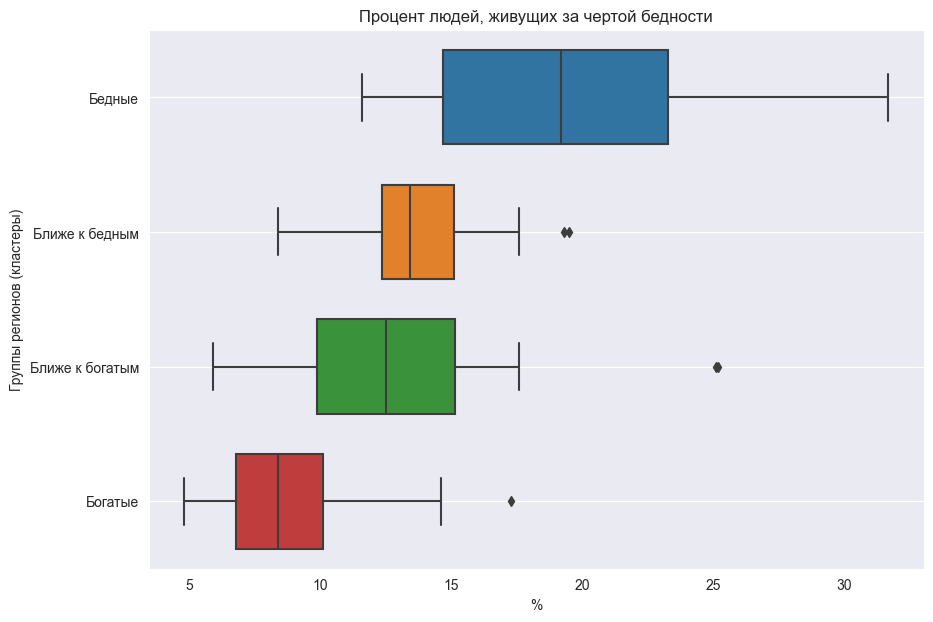

In [150]:
cluster_label = ['Бедные', 'Ближе к бедным', 'Ближе к богатым', 'Богатые']
best_df['cluster'] = best_df['cluster'].apply(lambda x: x if x == 1 else 4 if x == 0 else 3 if x == 2 else 2)
best_tmp = best_df.copy()

best_tmp['2020_poverty'] = - best_tmp['2020_poverty']
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_poverty',
    orient='h',
    width=0.7
)
b.set_title('Процент людей, живущих за чертой бедности');
b.set_xlabel('%')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

Результат вполне ожидаем. Чем боднее регион &mdash; тем выше в нём процент людей, живущих за чертой бедности.

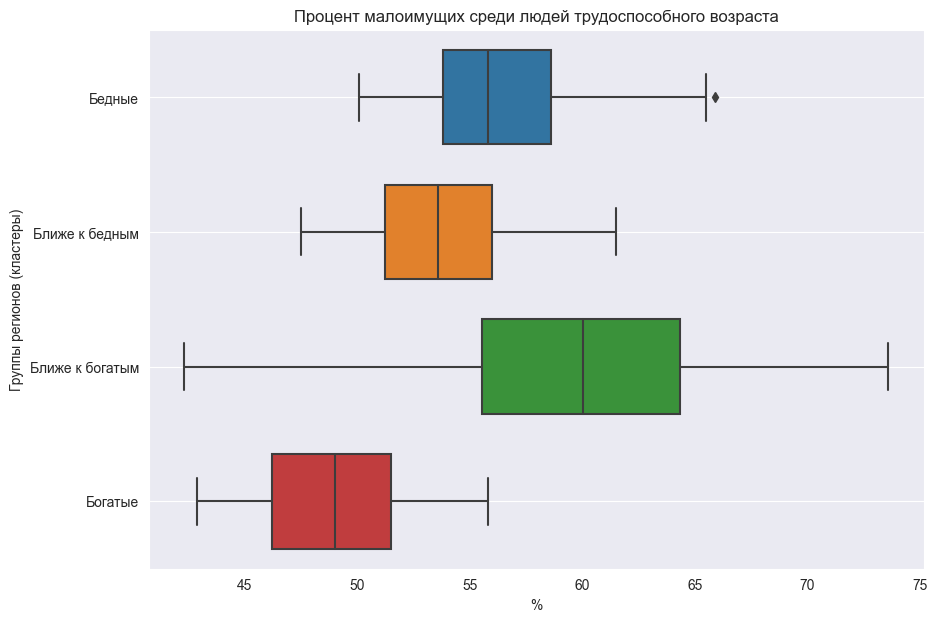

In [151]:
best_tmp['2020_s_worker'] = - best_tmp['2020_s_worker']
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_s_worker',
    orient='h',
    width=0.7
)
b.set_title('Процент малоимущих среди людей трудоспособного возраста')
b.set_xlabel('%')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

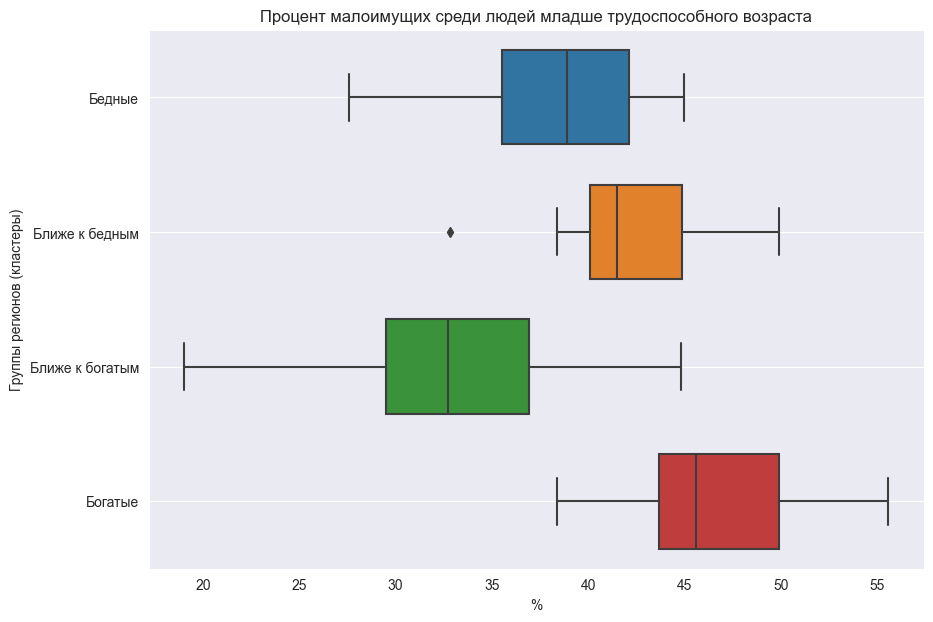

In [152]:
best_tmp['2020_s_child'] = - best_tmp['2020_s_child']
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_s_child',
    orient='h',
    width=0.7
)
b.set_title('Процент малоимущих среди людей младше трудоспособного возраста')
b.set_xlabel('%')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

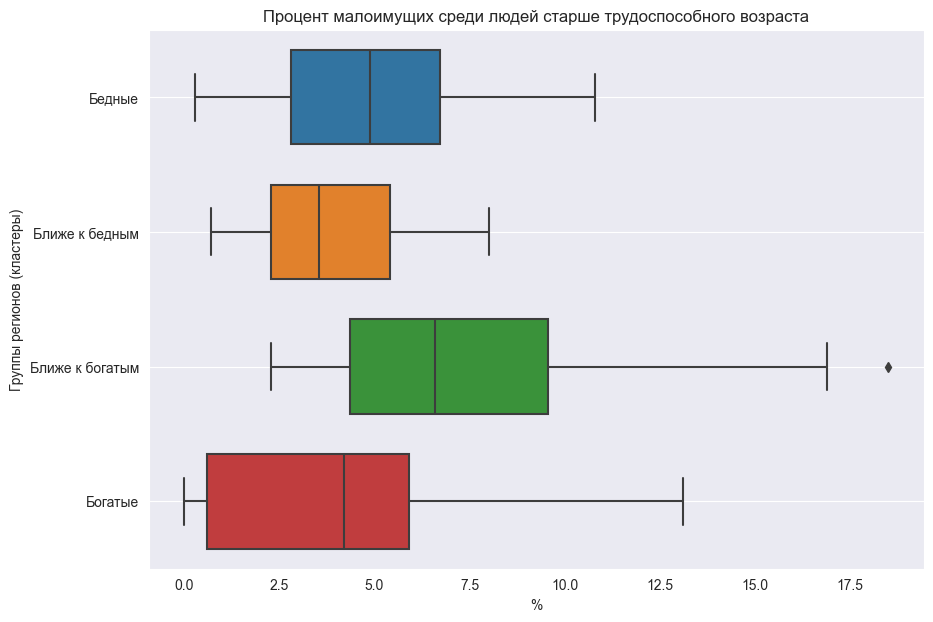

In [153]:
best_tmp['2020_s_retiree'] = - best_tmp['2020_s_retiree']
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_s_retiree',
    orient='h',
    width=0.7
)
b.set_title('Процент малоимущих среди людей старше трудоспособного возраста')
b.set_xlabel('%')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

Из диаграмм видно, что бедные регионы практически не имеют разницы в долях малоимущего населения по отношению к более благополучным. Наоборот, в богатых региона процент малоимущих детей выше, чем у всех остальных.

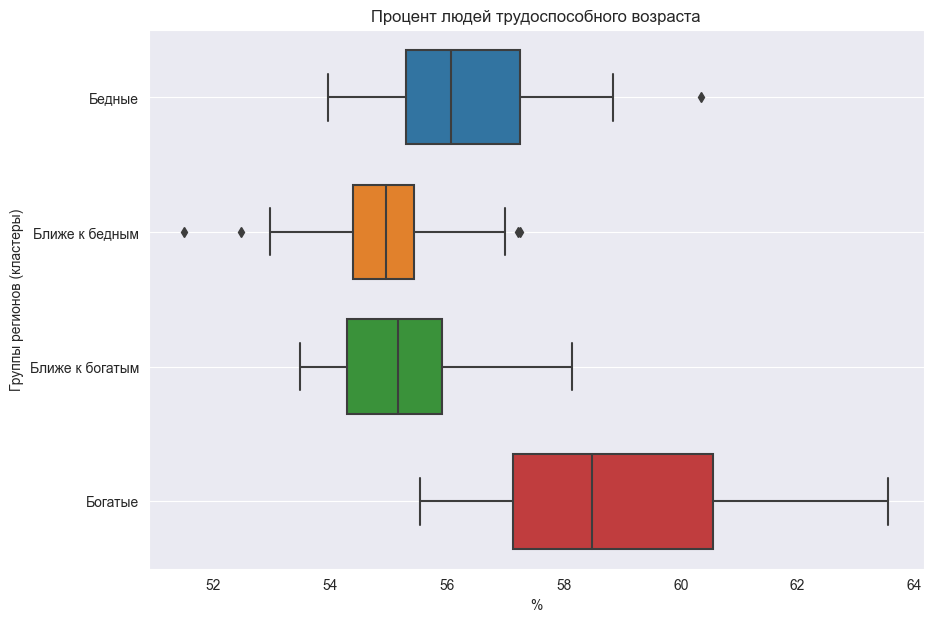

In [154]:
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_worker',
    orient='h',
    width=0.7
)
b.set_title('Процент людей трудоспособного возраста')
b.set_xlabel('%')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

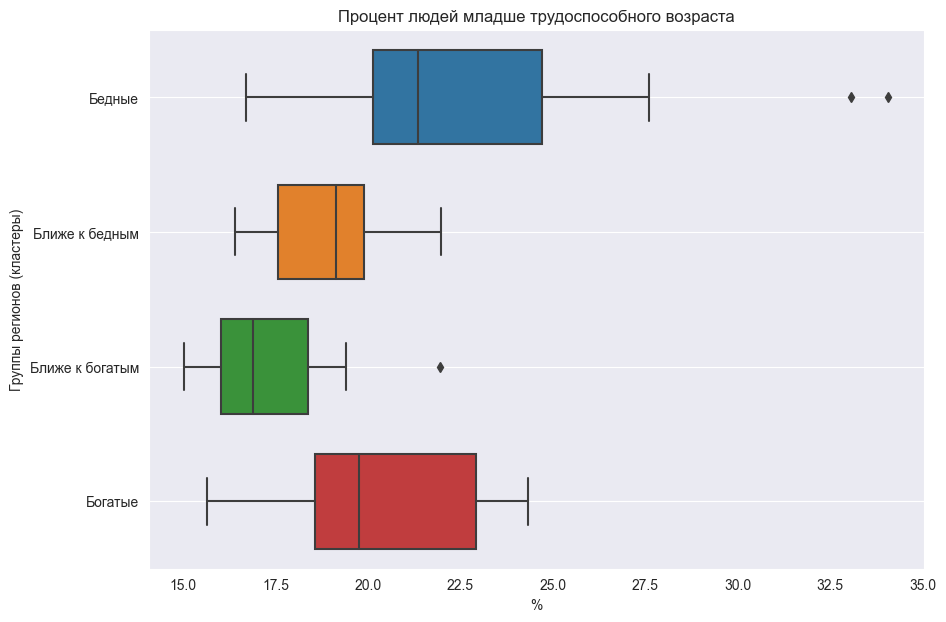

In [155]:
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_young',
    orient='h',
    width=0.7
)
b.set_title('Процент людей младше трудоспособного возраста')
b.set_xlabel('%')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

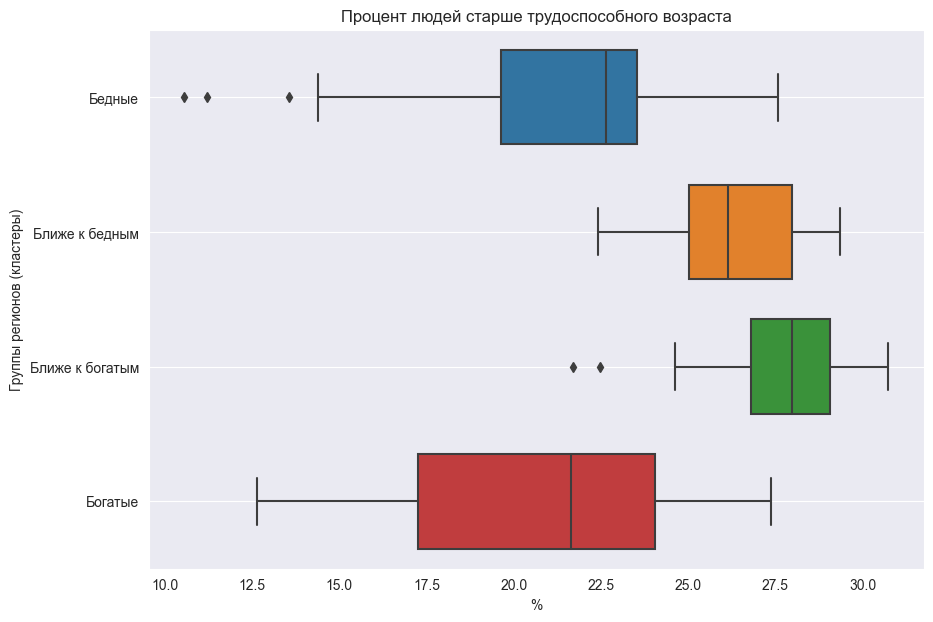

In [156]:
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_old',
    orient='h',
    width=0.7
)
b.set_title('Процент людей старше трудоспособного возраста')
b.set_xlabel('%')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

Для бедных регионов доля детей получается самой высокой из всех, а вот представителей старшего поколения наоборот мало по отношению к другим регионам.

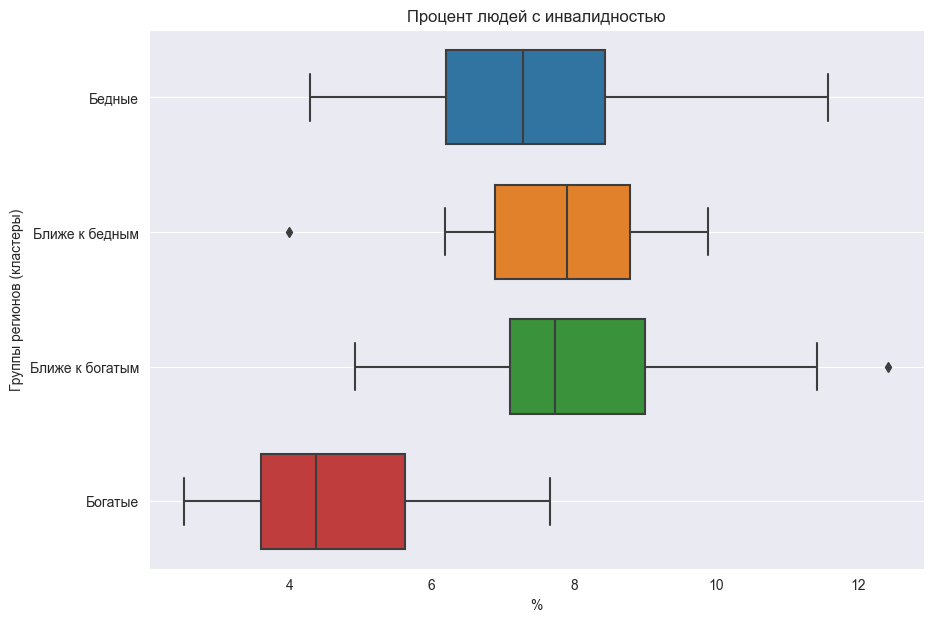

In [157]:
best_tmp['2020_disabled'] = - best_tmp['2020_disabled']
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_disabled',
    orient='h',
    width=0.7
)
b.set_title('Процент людей с инвалидностью')
b.set_xlabel('%')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

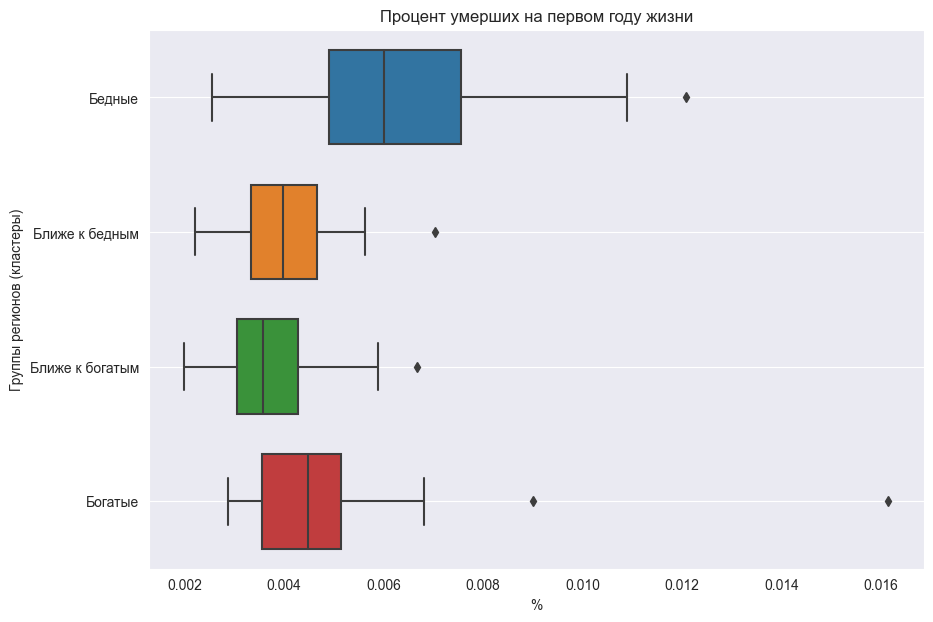

In [158]:
best_tmp['2020_child'] = - best_tmp['2020_child']
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_child',
    orient='h',
    width=0.7
)
b.set_title('Процент умерших на первом году жизни')
b.set_xlabel('%')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

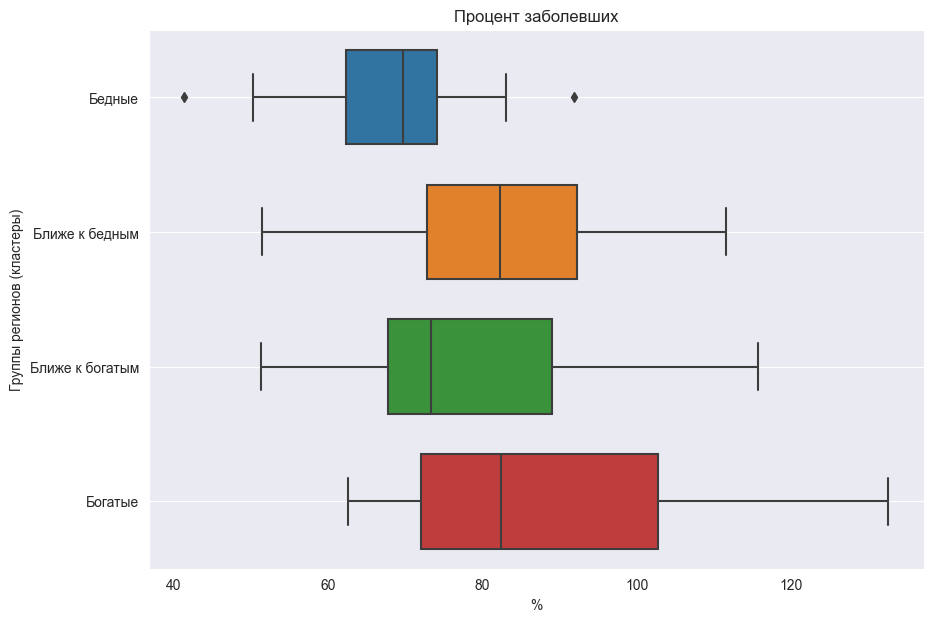

In [159]:
best_tmp['2020_morbidity'] = - best_tmp['2020_morbidity']/1000
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_morbidity',
    orient='h',
    width=0.7
)
b.set_title('Процент заболевших')
b.set_xlabel('%')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

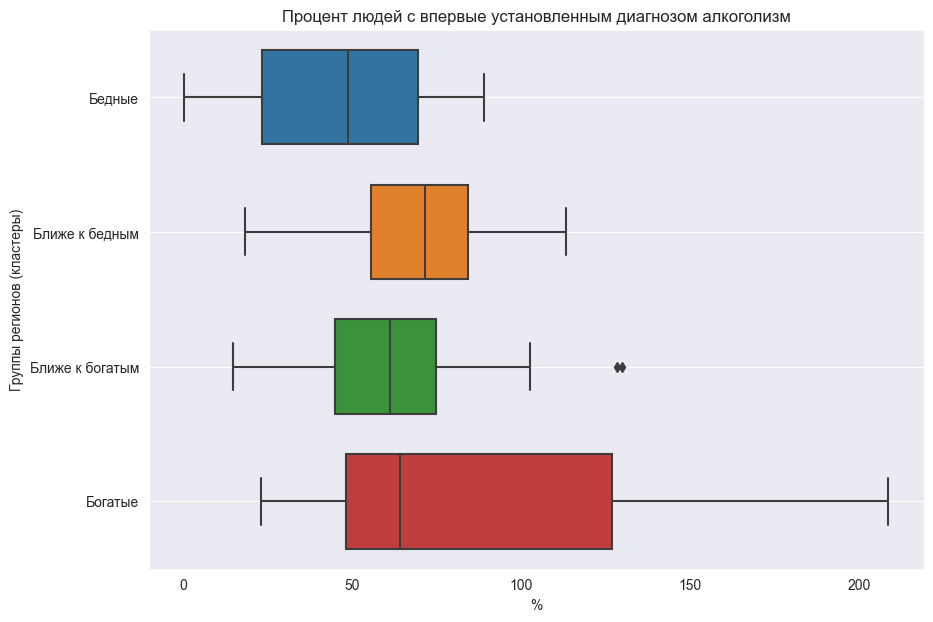

In [160]:
best_tmp['2020_alco'] = - best_tmp['2020_alco']
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_alco',
    orient='h',
    width=0.7
)
b.set_title('Процент людей с впервые установленным диагнозом алкоголизм')
b.set_xlabel('%')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

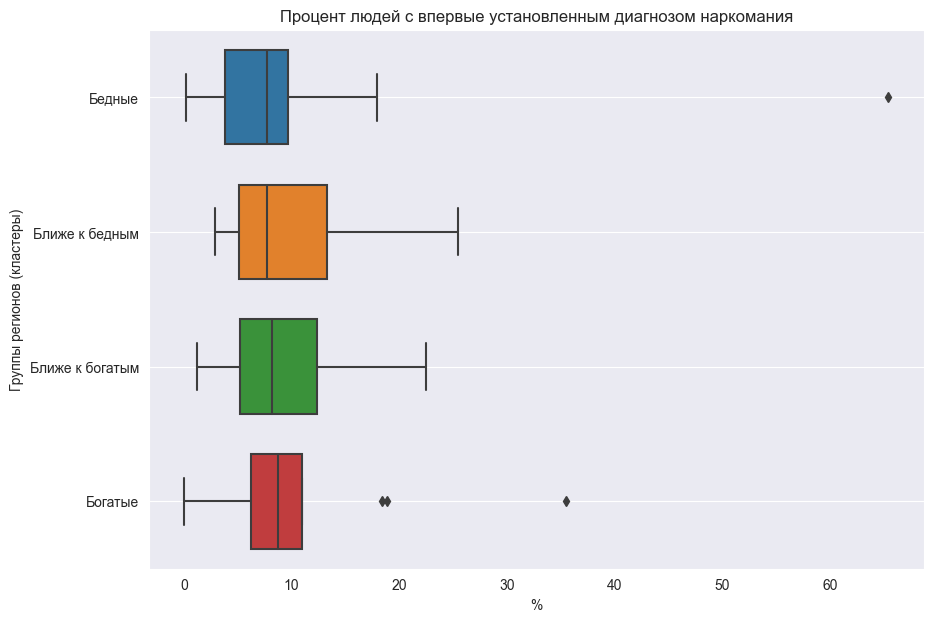

In [161]:
best_tmp['2020_drug'] = - best_tmp['2020_drug']
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_drug',
    orient='h',
    width=0.7
)
b.set_title('Процент людей с впервые установленным диагнозом наркомания')
b.set_xlabel('%')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

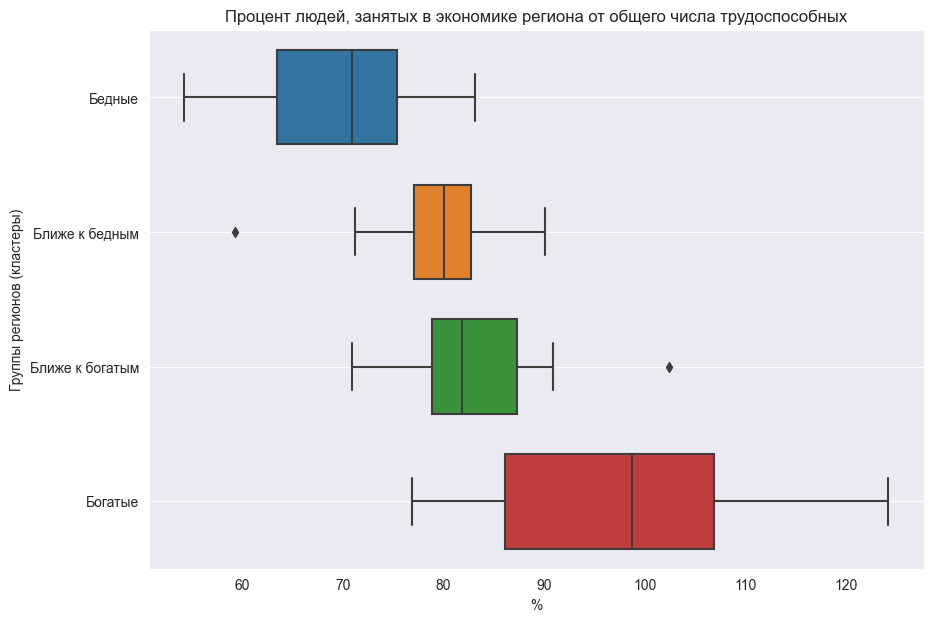

In [162]:
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_workers',
    orient='h',
    width=0.7
)
b.set_title('Процент людей, занятых в экономике региона от общего числа трудоспособных')
b.set_xlabel('%')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

Все показатели, связанные с группами людей, мы рассмотрели. Всеобъемлющих выводов, к сожалению, сделать не получится. Текущие выводы таковы:<ul>
<li>в бедных регионах процент живущих за чертой бедности выше, чем в других (было бы странно увидеть что-то иное);</li>
<li>в бедных регионах ниже процент занятых в экономике региона;</li>
<li>в бедных регионах больше проблем с медициной &mdash; процент умерших младенцев выше, заболеваемость ниже, чем в остальных регионах</li>
<li>алкоголизм и наркомания не связаны с &laquo;богатством&raquo; региона;</li>
<li>бедность региона не имеет явной сильной зависимости от численности социально уязвимых групп населения.</li>
</ul> 

Рассмотрим экономические показатели регионов.

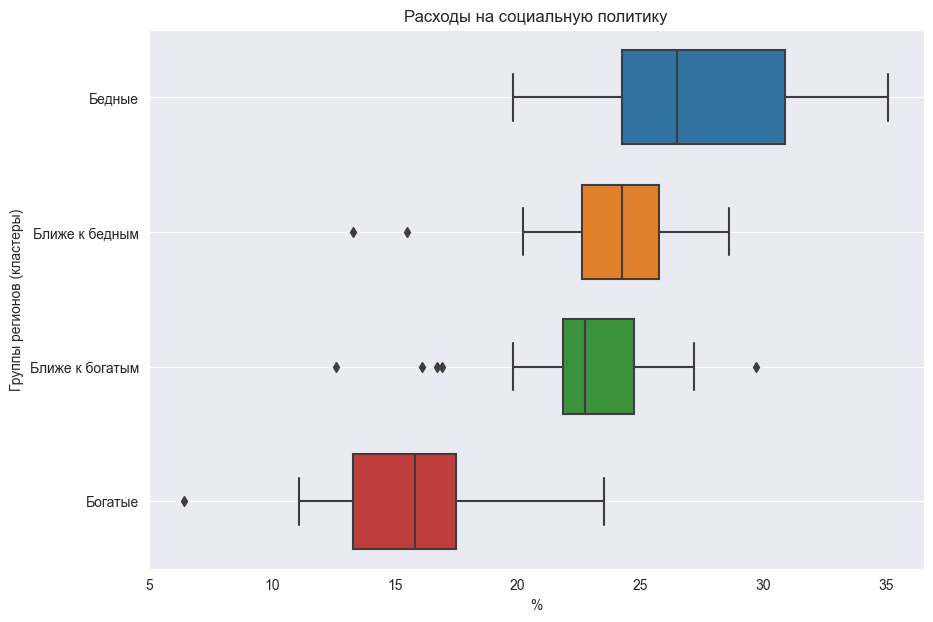

In [163]:
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_welfare',
    orient='h',
    width=0.7
)
b.set_title('Расходы на социальную политику')
b.set_xlabel('%')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

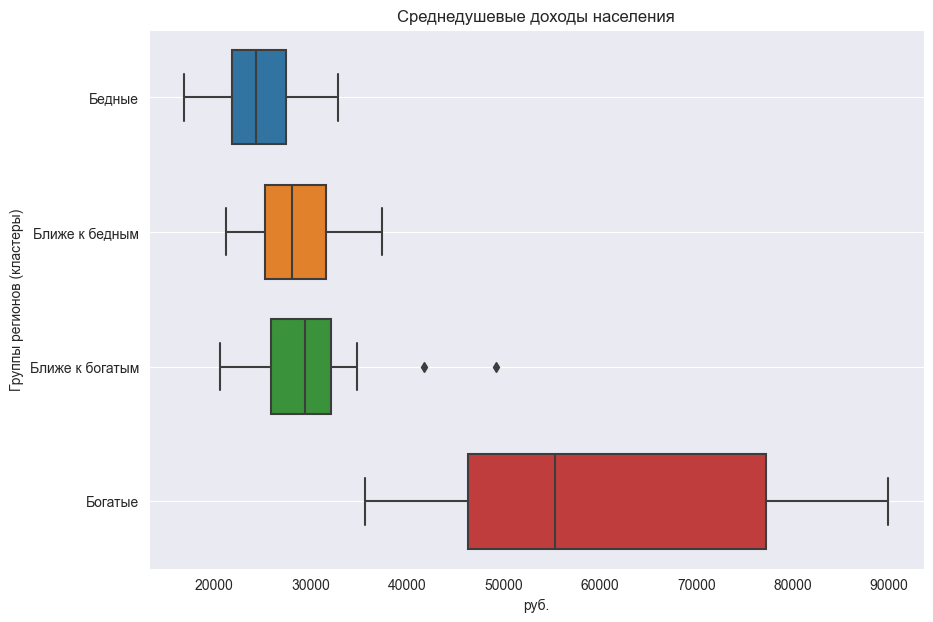

In [164]:
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_cash',
    orient='h',
    width=0.7
)
b.set_title('Среднедушевые доходы населения')
b.set_xlabel('руб.')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

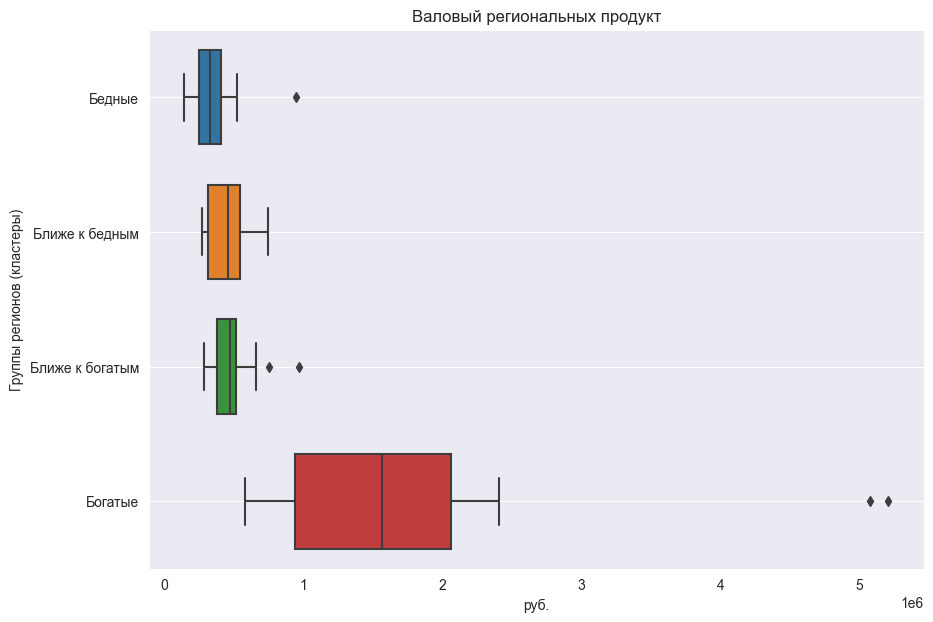

In [165]:
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_rp',
    orient='h',
    width=0.7
)
b.set_title('Валовый региональных продукт')
b.set_xlabel('руб.')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

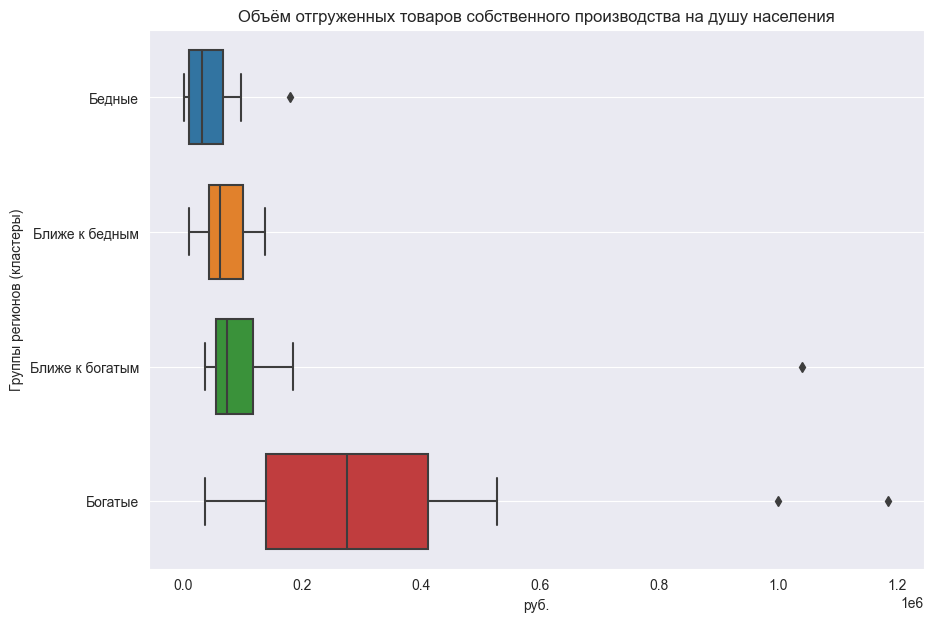

In [166]:
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_prod',
    orient='h',
    width=0.7
)
b.set_title('Объём отгруженных товаров собственного производства на душу населения')
b.set_xlabel('руб.')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

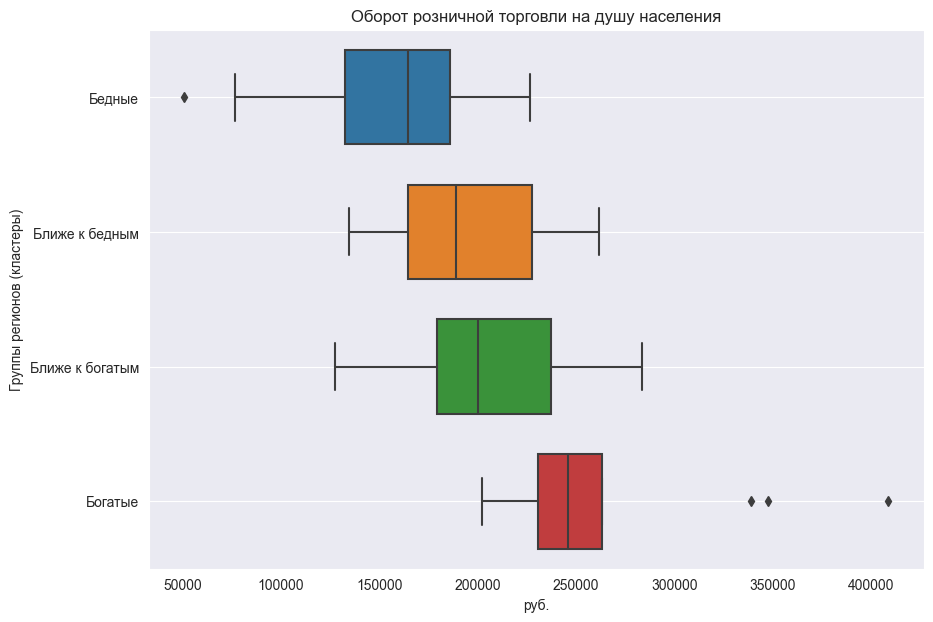

In [167]:
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_retail',
    orient='h',
    width=0.7
)
b.set_title('Оборот розничной торговли на душу населения')
b.set_xlabel('руб.')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

<p>Мы рассмотрели все имеющиеся у нас данные, кроме жилищных условий и преступности. Каких-то неожиданностей в полученных результатах нет.</p>
<p>Итоговые выводы можно сформулировать следующим образом:
<ul>
<li>характерной чертой бедных регионов является низкий уровень экономического развития; в этих регионах низкий объём валового продукта, меньший чем в других регионах объём отгруженных товаров собственного производства на душу населения и оборот розничной торговли;</li>
<li>в бедных регионах среди людей трудоспособного возраста самый маленький процент занятых в экономике и большой процент малоимущих, хотя и сопоставимый с таковым в обычных регионах;</li>
<li>в бедных регионах самый большой процент младенческой смертности, при этом самый большой процент молодого населения;</li>
<li>в бедных регионах ниже общий уровень заболеваемости, что, правда, скорее всего, как и детская смертность, связано с низким уровнем развития здравоохранения;</li>
<li>в бедных регионах самый большой процент от регионального бюджета идёт на поддержку малоимущего населения.</li>
</ul>
Условие развития региона остаётся одно &mdash; экономика. Рост экономики потянет за собой снижение безработицы и увеличение дохода на душу населения, что в свою очередь переведёт регион в разряд средних или богатых. Вопрос только в том, а готово ли государство вкладываться в экономику данного региона (выгодно ли это экономически), и готово ли население участвовать в экономическом развитии своего региона.
</p>

Создадим интерактивную карту региогнов. Т.к. стандартный geojson не включает в Российские регионы Крым и Севастополь &mdash; необходимый файл загружен с ресурса https://github.com/hairymax/offline_russia_plotly/blob/main/data/russia_regions.geojson. Исходный файл был немного доработан под нашу специфику.

In [ ]:
import json
import plotly.graph_objects as go

with open('data/rusmap.geojson', encoding="utf-8") as response:
    counties = json.load(response)

region_id_list = []
regions_list = []
for k in range(len(counties['features'])):
    region_id_list.append(counties['features'][k]['id'])
    regions_list.append(counties['features'][k]['properties']['region'])
df_regions = pd.DataFrame()
df_regions['region_id'] = region_id_list
df_regions['region'] = regions_list

df_regions.to_excel('out/region.xlsx')
best_df.to_excel('out/best.xlsx')

best_df = best_df.merge(df_regions, on='region')
best_df['cluster_name'] = best_df['cluster'].apply(lambda x: 'Богатый' if x == 4 else 'Бедный' if x == 1 else 'Обычный')

fig = go.Figure(go.Choroplethmapbox(geojson=counties,
                           locations=best_df['region_id'],
                           z=best_df['cluster'],
                           text=best_df['region'],
                        
                           colorbar_thickness=20,
                           customdata=np.stack([best_df['cluster_name'], -best_df['2020_poverty'], best_df['2020_rp'], best_df['2020_cash']], axis=-1),
                           hovertemplate='<b>%{text}</b>'+ '<br>' +
                                         'Тип региона: %{customdata[0]}<br />' +
                                         '% бедного населения: %{customdata[1]}<br/>' +
                                         'валовый региональный продукт: %{customdata[2]}<br/>' +
                                         'подушевой доход: %{customdata[3]}<br/>' +
                                         '<extra></extra>',
                           hoverinfo='text, z'))
fig.update_layout(mapbox_style="carto-positron",
                  mapbox_zoom=1, mapbox_center = {"lat": 66, "lon": 94})
fig.update_traces(marker_line_width=0)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()